FAO_LivestockFish_CommodityBalance

# Pre-Load

### Libraries and Settings

In [1]:
import requests
import urllib.request, urllib.parse, urllib.error
from bs4 import BeautifulSoup

import re
import os
import time
import datetime
import chardet
import zipfile
import json
from IPython.display import display

import matplotlib.pyplot as plt
import matplotlib.transforms
import seaborn as sns
import folium
from PIL import Image
%matplotlib inline

import numpy as np
import pandas as pd

# pd.set_option('precision', 4)
# pd.set_option('display.max_rows',500)
# pd.set_option('display.max_columns',500)
# pd.set_option('max_colwidth',1000)

def curl(url,fname,mode='wb'):
    response = urllib.request.urlopen(url).read()
    with open(fname, mode) as handle:
        handle.write(response)

### Variables

In [2]:
# 以下用于临时变量名 ======================================================================

# data -- 用于创建表格的临时数据，创建完后必须赋值给永久变量
# df   -- 用于画图的临时数据，画图时将所需数据赋值给它
# dfs  -- 用于画图的临时数据字典，画图时将所需数据赋值给它
# domain
# 其他小写字母

# 初始化全局变量，请小心操作 ===================================================

# 用户自定义参数，会随着用户设置的变化而变化
D = ''    # Domain
A = ''    # Area     单一的国家/地区，
G = ''    # Group    地区组合
E = ''    # Element
Is = {}   # Items
IsGroup = [] # Items group, in Is.keys()

# 根据用户变量生成的常量
DFs = {}        # 每个 Domain 的所有数据是一份 DF，keys=Domains，no index, columns=['Area Code', 'Area', 'Element', 'Item', 'Year', 'Unit', 'Value']
CDTs = {}       # 从DFs筛选数据的条件，key0=Domain, key1=Area, key2=Element, value=Items
PVs = {}        # 从DFs根据筛选条件生成的 DICT, key0=Domain, key1=Area, key2=Element, key3=Items, values=DF, index=Areas, columns=Years

Years = []      # 年份列表

PVs_AG = {}     # 某国家地区与其所在组合的某些 Items 的比较，key0=Domain, key1=Area, key2=Element, key3=[AG, A, G], index=Years, columns=[C,G]

# 目录常量
ROOT = './data/FAO/'
DATA_DIR = ROOT

# 必要信息常量 
DOMs = {}        # Domain 的描述字典， key=domain_name(file name's pref)
LIST_country=[]     # 国家级地区列表，Area Code < 5000
LIST_group=[]    # 地区组合列表，Area Code >= 5000
COUNT_country=0  # 国家级地区的数量
COUNT_group=0    # 地区组合的数量

### Meta Data

In [3]:
# 加载 Domain 字典
datasets = 'datasets_E.xml'
path = ROOT + datasets

with open(path, 'rb') as handle:
    xml = handle.read()
    soup = BeautifulSoup(xml, 'xml')

for dataset in soup.find_all('Dataset'):
    loc = dataset.FileLocation.string
    domain = loc[loc.find('bulkdownloads/')+len('bulkdownloads/'):loc.find('_E_All')]
    DOMs[domain] = {'DatasetCode': dataset.DatasetCode.string,
                    'DatasetName': dataset.DatasetName.string,
                    'Topic': dataset.Topic.string,
                    'DatasetDescription': dataset.DatasetDescription.string,
                    'MedaData': [dataset.Contact.string, dataset.Email.string, dataset.DateUpdate.string, dataset.CompressionFormat.string, dataset.FileType.string, dataset.FileSize.string, dataset.FileRows.string],
                    'Url_Normalized':dataset.FileLocation.string}

# 加载单一国家地区列表
with open(ROOT+'list_country.docx', 'r') as handle:
    for line in handle.readlines():
        line=line.strip('\n')
        LIST_country.append(line)
LIST_country.remove('China')
COUNT_country = len(LIST_country)
print('There are {} countries.'.format(COUNT_country))
# display(LIST_country)

# 加载国家地区组合列表
with open(ROOT+'list_group.docx', 'r') as handle:
    for line in handle.readlines():
        line=line.strip('\n')
        LIST_group.append(line)
COUNT_group = len(LIST_group)
print('There are {} groups.'.format(COUNT_group))
# display(LIST_country)

There are 225 countries.
There are 34 groups.


### Plot Style

In [4]:
plt.style.use(['ggplot'])

# font size
TIT_size = 14    # titles
LAB_size = 10    # labels
LEG_size = 10    # legends
TCK_size = 10    # ticklabels

LIN_wei = 1.5    # line weights
BAR_wid = 6      # bar width
GRD_wid = 0.5    # grid line width
GRD_clr = 'white' 
GRD_aph = 1     # grid alpha

CLs = ('hotpink','maroon','orangered','gold','deepskyblue','yellowgreen','darkgray','chocolate',
       'r','orange','maroon','hotpink','b','yellowgreen','deepskyblue','g','c','lightslategray','k')
MKs = ('o', 'x','o','x', 'v','.','v','.','o','x','o', 'x', 'v','.','v','.')
LSs = ('-','-','--', ':', ':','-.','-.','-','-','--','--', ':', ':','-.','-.')

# =============================================================================================================
def setX_quant(ax, ticks, step, label = ''):
    ax.set_xticks(ticks)
    ax.set_xlim(ticks[0]-step,ticks[-1]+step)
    ax.set_xticklabels(ticks, rotation=0, ha='center', fontsize=TCK_size)
    ax.set_xlabel(label, fontsize=LAB_size)
    ax.xaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)
    
def setX_quali(ax, ticks, label = ''):
    ax.set_xticklabels(ticks, rotation=90, ha='center', fontsize=TCK_size)
    ax.set_xlabel(label, fontsize=LAB_size)
    ax.xaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)

def setY_quant(ax, y_max, label = ''):
    tick_num = 9
    step = y_max/(tick_num-1)
    min_gap = 10
    
    if step < 1:
        step = round(step,1)
        dec=1
    elif step < 10:
        step = int(step)
        dec=0
    elif step/min_gap < 10:
        step = int(step/min_gap)*10
        dec=0
    else:
        n=0
        while step/min_gap >= 10:
            step = int(step/min_gap)
            n += 1
        step = int(step/min_gap)*(min_gap**(n+1))
        dec=0
        
    y_max = step*(tick_num+1)        
    ticks = np.round(np.arange(0, y_max+step, step),decimals=dec)
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1]+step)
    ax.set_yticklabels(ticks, fontsize=TCK_size)
    ax.set_ylabel(label, fontsize=LAB_size)    
    ax.yaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)
    
def setY_per(ax):
    ticks=np.round(np.linspace(0, 100, num=11, endpoint=True), decimals=0)
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1])
    ax.set_yticklabels(ticks, fontsize=TCK_size)
    ax.set_ylabel('Percentage (%)', fontsize=LAB_size)
    ax.yaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)

# Part 1

## Setting Variables

### Domain Selection - 'Production_LivestockPrimary'

In [5]:
def rdDF(domain):
    display(DOMs[domain])
    path_csv = DATA_DIR+domain+'.csv'
    
    data = pd.read_csv(path_csv)
    
#     display(data.head())
#     display(data.tail())
    print(data.shape)
    return data

In [6]:
# 给Domain赋值
D = 'CommodityBalances_LivestockFish'

data = rdDF(D)

{'DatasetCode': 'BL',
 'DatasetName': 'Food Balance: Commodity Balances - Livestock and Fish Primary Equivalent',
 'Topic': 'Most crop and livestock products, including processed products, under agricultural activity.',
 'DatasetDescription': 'Food supply data is some of the most important data in FAOSTAT. In fact, this data is for the basis for estimation of global and national undernourishment assessment, when it is combined with parameters and other data sets. This data has been the foundation of food balance sheets ever since they were first constructed. The data is accessed by both business and governments for economic analysis and policy setting, as well as being used by the academic community.',
 'MedaData': ['Mr. Salar Tayyib',
  'faostat@fao.org',
  '2018-01-17',
  'zip',
  'csv',
  '16605KB',
  '2868088'],
 'Url_Normalized': 'http://fenixservices.fao.org/faostat/static/bulkdownloads/CommodityBalances_LivestockFish_E_All_Data_(Normalized).zip'}

(2459791, 7)


### Optimize Format, Drop Nan, Drop Duplicates

In [7]:
DFs[D] = data.dropna().drop_duplicates()
DFs[D].shape

(2296529, 7)

### Show Years Range

In [8]:
Years = DFs[D]['Year'].unique()
Years

array([1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971,
       1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982,
       1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993,
       1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004,
       2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013])

### Area Selection

In [9]:
# 给 Area 赋值
A = 'China, mainland'

data = DFs[D][DFs[D]['Area']==A]

# display(data.groupby(['Element','Item']).count())
display('Elements:', data.Element.unique())
display('Items:', data.Item.unique())

'Elements:'

array(['Production', 'Import Quantity', 'Export Quantity',
       'Domestic supply quantity', 'Food supply quantity (tonnes)',
       'Other uses', 'Processing', 'Stock Variation', 'Seed', 'Losses',
       'Feed'], dtype=object)

'Items:'

array(['Aquatic Animals, Others', 'Aquatic Plants', 'Bovine Meat',
       'Butter, Ghee', 'Cephalopods', 'Cheese', 'Cream', 'Crustaceans',
       'Demersal Fish', 'Eggs', 'Fats, Animals, Raw', 'Fish Meal',
       'Fish, Body Oil', 'Fish, Liver Oil', 'Freshwater Fish',
       'Hides and skins', 'Honey', 'Marine Fish, Other', 'Meat Meal',
       'Meat, Other', 'Milk - Excluding Butter', 'Milk, Skimmed',
       'Milk, Whole', 'Molluscs, Other', 'Mutton & Goat Meat',
       'Offals, Edible', 'Pelagic Fish', 'Pigmeat', 'Poultry Meat',
       'Silk', 'Whey', 'Wool (Clean Eq.)', 'Animal fats',
       'Aquatic Products, Other', 'Fish, Seafood', 'Meat', 'Offals'],
      dtype=object)

### Element and Items Selection

In [10]:
def mkPV_Item_Year( domain, area, element):   
    df = DFs[domain]
    df = df[(df['Area']==area) & (df['Element']==element)]
    df = pd.pivot_table(df,index=['Item'],columns=['Year'],values=['Value'])
    df.columns.set_names([None, None], inplace=True)    # reset mult-index name 
    df.columns = df.columns.get_level_values(-1)        # flat the multi-index by the last element of each index tuple.
    pivot = df
#     display(pivot.head())
    return pivot  

def mkPV_Element_Year( domain, area, item):   
    df = DFs[domain]
    df = df[(df['Area']==area) & (df['Item']==item)]
    df = pd.pivot_table(df,index=['Element'],columns=['Year'],values=['Value'])
    df.columns.set_names([None, None], inplace=True)    # reset mult-index name 
    df.columns = df.columns.get_level_values(-1)        # flat the multi-index by the last element of each index tuple.
    pivot = df
#     display(pivot.head())
    return pivot 

In [11]:
# 用于单项测试，空值可跳过
E = ''

I = ''

pivot=pd.DataFrame()
if E != '': pivot = mkPV_Item_Year(D, A, E)
if I != '': pivot = mkPV_Element_Year(D, A, I)
if pivot.shape==(0,0):pass
else:
    pivot.sort_values(Years[-1], axis=0, ascending = False, inplace = True)

    rankings={}
    for i in pivot.index.values:
        ranks=np.array([])
        for y in pivot.columns:
            pivot.sort_values(y, axis=0, ascending = False, inplace = True)
            rank = pivot.index.tolist().index(i)
            ranks = np.append(ranks,rank)
        rankings[i]=ranks

    fig = plt.figure(figsize = (16,8))
    plt.title('Rankings of All Items')
    n=0
    lines = LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs
    colors = CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs
    for i in pivot.index.values:
        plt.plot(pivot.columns, rankings[i],color=colors[n], linestyle=lines[n])
        n+=1
    plt.legend(labels=pivot.index.values,loc='lower center',bbox_to_anchor=(1.1,0),borderaxespad = 0.)
    ax = plt.gca().invert_yaxis()

#### Explorded Classification of Items

##### FoodSupply_LivestockFish & CommodityBalances_LivestockFish

    'Grand Total':['Animal Products', 'Aquatic Plants'],
    
    'Animal Products':['Meat','Fish, Seafood','Milk - Excluding Butter','Eggs','Offals','Animal fats'],
    'Meat': ['Poultry Meat', 'Pigmeat','Bovine Meat','Mutton & Goat Meat','Meat, Other'],
    'Fish, Seafood':['Freshwater Fish','Molluscs, Other', 'Crustaceans','Cephalopods','Demersal Fish','Pelagic Fish','Marine Fish, Other'],
    'Milk - Excluding Butter':[],
    'Eggs':[],
    'Offals':[],
    'Animal fats':[],

##### FoodSupply_Crops & CommodityBalances_Crops

In [12]:
# 给 Elements 赋值
E = 'Production'
# 给 Items 赋值
Is = {
    'Grand Total':['Grand Total','Animal Products'],
#   动物产品（未包含蜂蜜）
    'Animal Products':['Meat','Fish, Seafood','Eggs','Milk - Excluding Butter','Offals','Animal fats'],
#   畜禽肉
    'Meat': ['Pigmeat','Bovine Meat','Mutton & Goat Meat','Poultry Meat', 'Meat, Other'],
    'Pigmeat':[],
    'Bovine Meat':[],
    'Mutton & Goat Meat':[],
    'Poultry Meat':[], 
#   水产（未包含子类）
    'Fish, Seafood':[],
#   蛋类
    'Eggs':[],
#   奶类
    'Milk - Excluding Butter':[],
}

data = data[(data['Element']==E) & (data['Item'].isin(Is))]

# display(data.groupby(['Element','Item']).count())

# display(data.head(2))
# display(data.tail(2))

# display(data.groupby(['Item']).count())
# display(data.groupby(['Unit']).count())                   # 查看单位

# 生成条件
CDTs[D] ={}
CDTs[D][A] ={}
CDTs[D][A][E] = Is
# display(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


In [13]:
def ranking_ItemInArea(
    domain,
    area,
    element,
    items_groups=[],
):
#     如果不设置items_groups，那么 items 仅包含 Is 的末梢，即值为空的键
    if items_groups==[]: items = ITEMs       
#     否则，items会包含 Is 中键为 items_groups 中的 item，以及所有的末梢，最后取其的 set 去掉重复元素
    else:
        items = []
        for i in CDTs[domain][area][element]:
            items.append(i)
        for g in items_groups:
            for i in CDTs[domain][area][element][g]:
                items.append(i)
        items = list(set(items))
    
    pivot = mkPV_Item_Year(domain=domain,area=area,element=element).copy()
    
    rankings = {}
    for i in items:
        if i in pivot.index:
            ranks=np.array([])
            for y in Years:
                pivot.sort_values(y, axis=0, ascending = False, inplace = True)
                rank = pivot.index.tolist().index(i)
                ranks = np.append(ranks,rank+1)
            rankings[i]=ranks
    
    df_rank = pd.DataFrame(rankings)
    df_rank.index=Years

#     fig = plt.figure(figsize = (16,8))
#     plt.title('Rankings of Main Items in {}'.format(area))
    
#     n=0
#     lines = LSs+LSs
#     colors = CLs+CLs
#     for i in df_rank.columns.values:
#         plt.plot(Years, rankings[i], color=colors[n], linestyle=lines[n])
#         n+=1
#     plt.legend(labels=df_rank.columns,loc='lower center',bbox_to_anchor=(1.1,0),borderaxespad = 0.)
#     ax = plt.gca().invert_yaxis()
    
    return list(df_rank.columns)

In [15]:
# 设置 items group, 自动生成 ITEMs_all, ITEMs
IsGroup = ['Animal Products', 'Meat']

ITEMs_all = ranking_ItemInArea(D,A,E,items_groups=IsGroup)
print(ITEMs_all)

items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

['Bovine Meat', 'Offals', 'Animal fats', 'Milk - Excluding Butter', 'Eggs', 'Mutton & Goat Meat', 'Fish, Seafood', 'Pigmeat', 'Poultry Meat', 'Meat', 'Meat, Other']
['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


### Create Pivots for Items

In [16]:
def mkPVs_Area_Year(
    domain,
    area,
    element,
    items_groups=[],
):
    
#     如果不设置items_groups，那么 items 仅包含 Is 的末梢，即值为空的键
    if items_groups==[]: items = ITEMs                
#     否则，items会包含 Is 中键为 items_groups 中的 item，以及所有的末梢，最后取其的 set 去掉重复元素
    else:
        items = []
        for i in CDTs[domain][area][element]:
            items.append(i)
        for g in items_groups:
            for i in CDTs[domain][area][element][g]:
                items.append(i)
        items = list(set(items))
    
    df = DFs[domain].copy()
    
    dfs = {}
    for i in items:
        dfs[i] = df[(df['Element']==element) & (df['Item']==i)][['Area','Year','Value']]

    pivots = {}
    for i in items:
        df = pd.pivot_table(dfs[i],index=['Area'],columns=['Year'],values=['Value'])
        df.columns.set_names([None, None], inplace=True)    # reset mult-index name 
        df.columns = df.columns.get_level_values(-1)        # flat the multi-index by the last element of each index tuple.
        if df.shape != (0, 0):
            pivots[i] = df
    return pivots

In [17]:
PVs[D]={}
PVs[D][A]={}
PVs[D][A][E] = mkPVs_Area_Year(D, A, E, IsGroup)

# for i, pv in PVs[D][A][E].items():
#         print(Unit)
#     display(E, i, pv.tail(2))

## Results

### 1. An Area's Word Ranking of Some Items

In [18]:
def ranking_AreaItemInWorld(
    domain,
    area,
    element,
    items_group='',
    items=[],
    area_list=LIST_country,
    rank_max=150,
    fig_size=(6,4),
    colors=[],
):  
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
        
    dfs = PVs[domain][area][element]
    
    rankings = {}
    rank_maxes=np.array([])
    for i in items:
        if i in dfs.keys():
            df = dfs[i].copy()
            ranks = np.array([])
            try: 
                df_areas = df[df.index.isin(area_list)]
                for year in df_areas.columns:
                    rank = df_areas.sort_values(year, ascending=False).index.tolist().index(area)+1
                    ranks = np.append(ranks,rank)
                rankings[i]=ranks
                rank_maxes = np.append(rank_maxes, np.array(ranks).max())
            except:continue
    df_rank = pd.DataFrame(rankings)
    df_rank = df_rank.transpose()
    df_rank.columns = Years
    display(df_rank[[Years[0],Years[-1]]])
    
    if colors==[]: colors=CLs
    else: colors=colors
    
    # =========================================
    fig = plt.figure(figsize = fig_size, dpi=300)
    plt.title("World Ranking of {}: {}".format(element, area), fontsize=TIT_size)
    X_step=5
    
    n=0
    for i in rankings.keys():
        plt.plot(Years[::X_step], rankings[i][::X_step], color=colors[n], linestyle=':', marker='o', linewidth=3, alpha=1)
        n+=1
        
    ax = plt.gca()
    ax.legend(labels=rankings.keys(),fontsize=LEG_size,frameon=False,
             loc='center left',bbox_to_anchor=(1.0,0.5),borderaxespad = 0.)

    setX_quant(ax, Years[::X_step], X_step)
    step=10
    y_max = rank_max      
    ticks = range(0, y_max+step, step)
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1]+step)
    ax.set_yticklabels(ticks, fontsize=TCK_size)
    ax.set_ylabel('Rankings', fontsize=LAB_size)    
    ax.yaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)
    
    ax = plt.gca().invert_yaxis()
    
    img='./results/img/FAO_LivestockFish_CommodityBalance/FAO_{}_{}_Ranking.png'.format(domain.title(), element[:element.find('/')].title())
    bbox = matplotlib.transforms.Bbox([[-1, -0], [12, 8]])
    fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)

,1961,2013
Pigmeat,4.0,1.0
Bovine Meat,53.0,3.0
Mutton & Goat Meat,15.0,1.0
Poultry Meat,3.0,2.0
"Fish, Seafood",4.0,1.0
Eggs,3.0,1.0
Milk - Excluding Butter,32.0,3.0


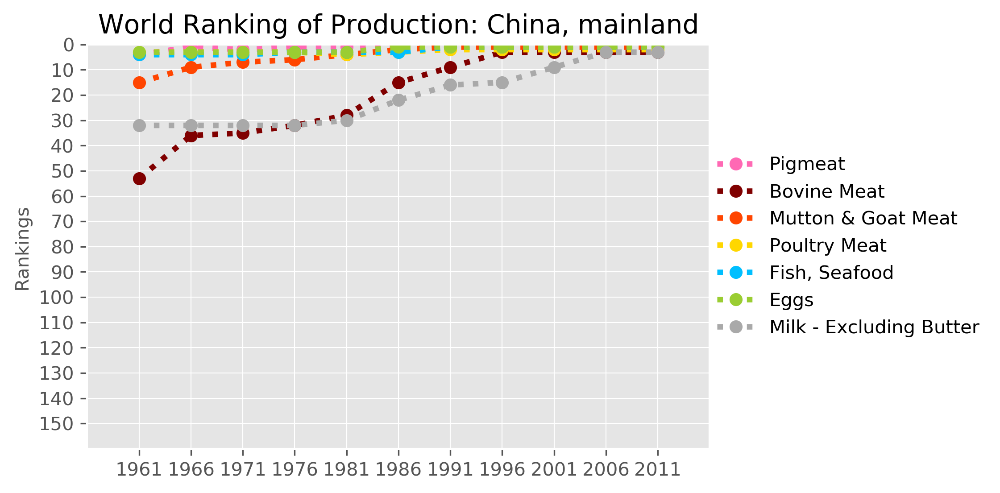

In [19]:
# 根据需要设置items和颜色
ranking_AreaItemInWorld(D,A,E,rank_max=150)

### 2. An Area's Main Items and Trends

In [20]:
def plotTrends(
    domain,
    area, 
    element, 
    items_group='',
    items=[],
    toUnit='',   
    changeUnit = 1,             # 单位转换，值变为原来的多少倍
    fig_size = (14, 7),
    colors=CLs,
    stacked=True,
):
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
        
    print('items =', items)

    df = DFs[domain][(DFs[domain]['Area']==area)\
                   & (DFs[domain]['Element']==element)\
                   & (DFs[domain]['Item'].isin(items))].dropna().drop_duplicates().copy()

    dfs = {}
    for i in items:
        dfs[i] = df[df['Item']==i][['Year','Value']].fillna(0)
        dfs[i]['Value'] = dfs[i]['Value']*changeUnit
        dfs[i]=dfs[i].set_index('Year')
        
    df_concat = pd.DataFrame()
    for i in items:
        df_concat = pd.concat([df_concat, dfs[i]], axis=1)
    df_concat.columns=items
    df_concat['Sum'] = df_concat.apply(lambda x: x.sum(), axis=1)

#         print(Unit)
    display(df_concat[items].tail())
    
    X_step=5
    X_ticks=Years[::X_step]
    
    if toUnit=='': Y_label = element
    else: 
        if '(' in element: Y_label = element[:element.find('(')] + '({})'.format(toUnit)
        else: Y_label=element+' ({})'.format(toUnit)

    if stacked==False:
        fig = plt.figure(figsize=(7,4),dpi=300)
        df_concat[items].plot.area(color=colors, stacked=False, alpha=0.4, ax=plt.gca())
        Y_max = df_concat[items].values.max()
        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False,)
        setX_quant(ax, X_ticks, X_step)
        setY_quant(ax, Y_max, Y_label)
        img='./results/img/FAO_{}_{}_Trends_{}.png'.format(domain, element[:element.find('/')],items_group)
        bbox = matplotlib.transforms.Bbox([[-0, -0], [10, 5]])
        fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)
    
    else:
        fig = plt.figure(figsize = fig_size,dpi=300)
        fig.tight_layout()                          
        plt.subplots_adjust(wspace =0.2, hspace =0.11)
        plt.suptitle("\n\nTrends of{}{}: {}".format(' '+items_group+' ',element, area), fontsize=TIT_size)

        # ===================================================
        ax = fig.add_subplot(2,2,1)
        df_concat[items].plot.line(color=colors, ax=plt.gca())
        
        Y_max = df_concat[items].values.max()
        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False,
                 )
        setX_quant(ax, X_ticks, X_step)  
        setY_quant(ax, 1.5*Y_max, Y_label)

        # ===================================================
        ax = fig.add_subplot(2,2,2)
        df_concat[items].plot.area(color=colors, stacked=True, alpha=1, ax=plt.gca())

        Y_max = df_concat['Sum'].values.max()
        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False,
                 )
        setX_quant(ax, X_ticks, X_step)
        setY_quant(ax, 1.5*Y_max, Y_label)

        #====================================================
        ax = fig.add_subplot(2,2,3)
        for i in items:
            df_concat[i]=df_concat[i]/df_concat['Sum']*100
        df_concat[items].plot.line(color=colors, ax=plt.gca())

        ax = plt.gca()
        ax.legend_.remove()
        setX_quant(ax, X_ticks, X_step)
        setY_per(ax)

        #====================================================
        ax = fig.add_subplot(2,2,4)
        df_concat[items].plot.area(color=colors, stacked=True, alpha=1, ax=plt.gca())

        ax = plt.gca()
        ax.legend_.remove()
        setX_quant(ax, X_ticks, X_step)
        setY_per(ax)

        img='./results/img/FAO_LivestockFish_CommodityBalance/FAO_{}_{}_Trends_{}.png'.format(domain, element[:element.find('/')],items_group)
        bbox = matplotlib.transforms.Bbox([[-0, -0], list(fig_size)])
        fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)

items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,4693.44,635.40,383.85,1594.900,4876.4638,2742.50,4004.6136
2010,4860.00,653.84,398.90,1656.100,5113.6608,2762.70,4080.2820
2011,4840.70,647.50,393.10,1708.800,5344.4811,2811.41,4143.5000
2012,5130.00,662.30,401.00,1803.256,5622.8526,2861.20,4238.4100
2013,5273.30,673.00,408.10,1826.490,5622.8526,2876.00,4019.3200


items = ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats']


,Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Offals,Animal fats
Year,,,,,,
2009,7458.902,4876.4638,2742.50,4004.6136,367.5750,340.6332
2010,7727.324,5113.6608,2762.70,4080.2820,388.0406,360.4357
2011,7755.204,5344.4811,2811.41,4143.5000,383.4352,359.0242
2012,8162.330,5622.8526,2861.20,4238.4100,389.2534,384.8977
2013,8346.164,5622.8526,2876.00,4019.3200,397.0281,392.9760


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Meat, Other"
Year,,,,,
2009,4693.44,635.40,383.85,1594.900,151.312
2010,4860.00,653.84,398.90,1656.100,158.484
2011,4840.70,647.50,393.10,1708.800,165.104
2012,5130.00,662.30,401.00,1803.256,165.774
2013,5273.30,673.00,408.10,1826.490,165.274


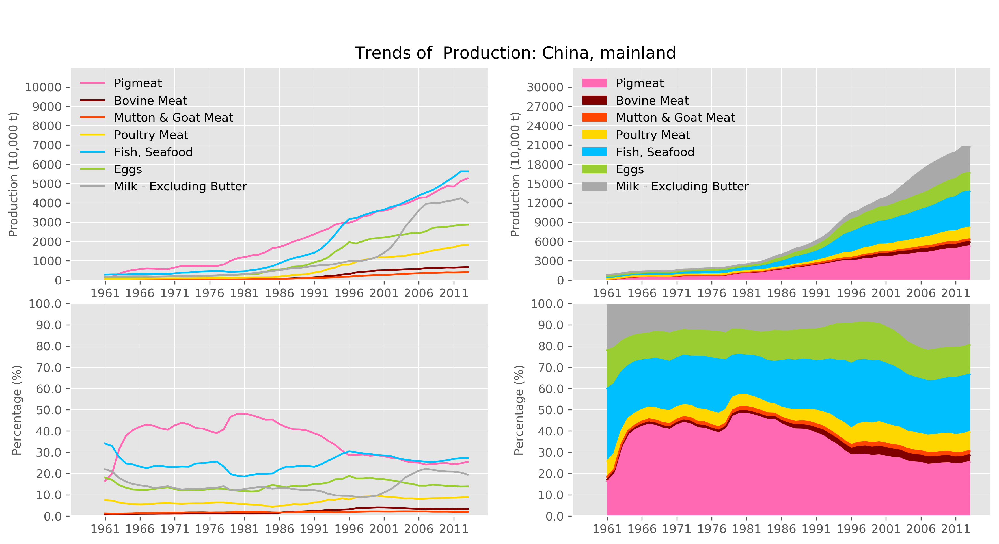

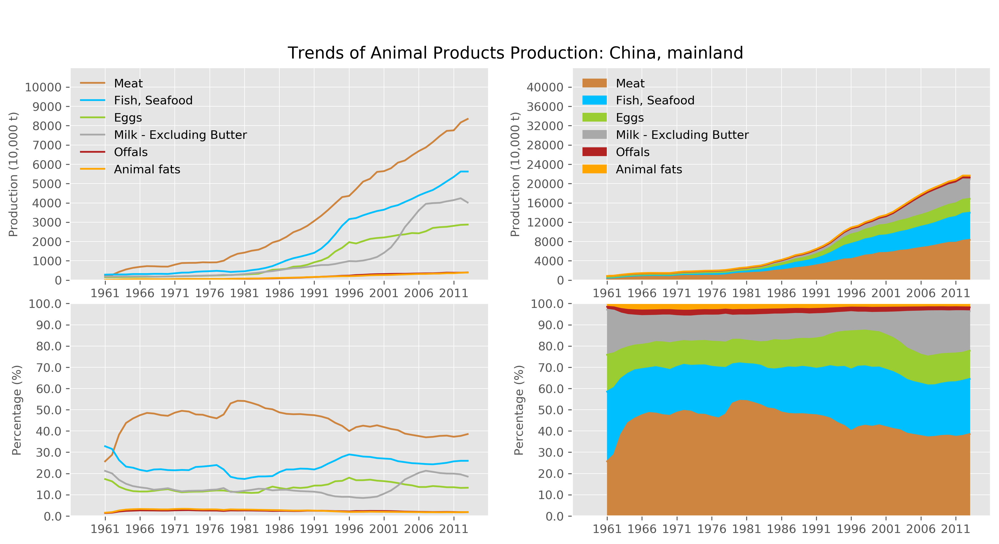

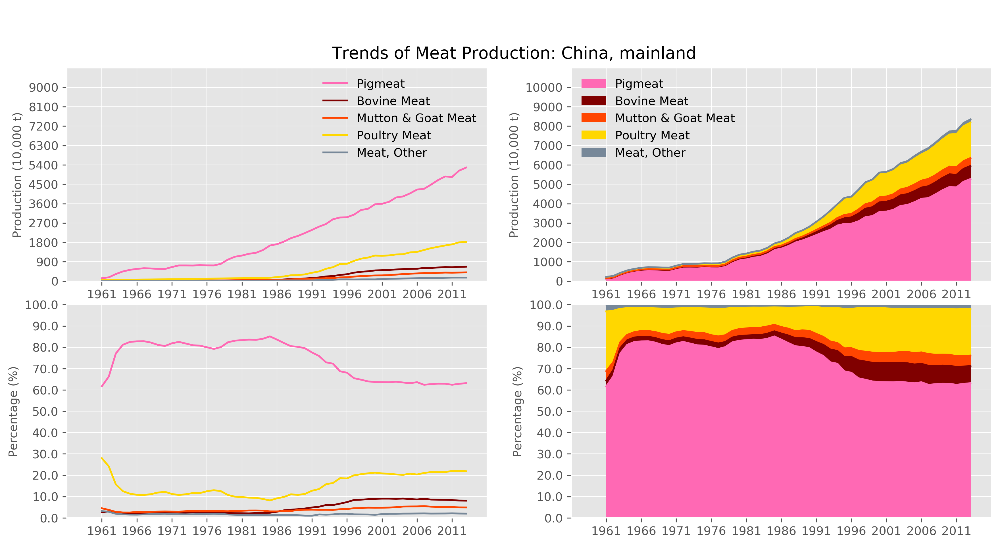

In [21]:
# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E, toUnit='10,000 t', changeUnit = 1/10000)

# 设置颜色
cmeat,cfish,cegg,cmilk,coffal,cfat=\
'peru','deepskyblue','yellowgreen','darkgray','firebrick','orange'
cpig,ccattle,cgoat,cbirds,cother=\
'hotpink','maroon','orangered','gold','lightslategray'

# 重要总类的分类
plotTrends(D, A, E, items_group='Animal Products', 
           toUnit='10,000 t', changeUnit = 1/10000,
           colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
          )
plotTrends(D, A, E, items_group='Meat', 
           toUnit='10,000 t', changeUnit = 1/10000,
           colors=[cpig,ccattle,cgoat,cbirds,cother],
          )

### 3. World Map of Some Items in Some Years

In [25]:
def mkDataMaps(
    domain,
    area,
    element,
    items_group='',
    items=[],
    group='World',
    toUnit='',
    changeUnit=1,
): 
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
            
    years = [Years[-1]-20,Years[-1]]
    
    if toUnit=='': Y_label = element
    else: 
        if '(' in element: Y_label = element[:element.find('(')] + '({})'.format(toUnit)
        else: Y_label = element + ' ({})'.format(toUnit)

    
    dfs = PVs[domain][area][element]
    
    fig_size=(14,16)
    fig=plt.figure(figsize=fig_size, dpi=300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.6, hspace =1.)
    plt.suptitle('{}: China, mainland Vs. Top5 in the World'.format(element), fontsize=TIT_size)
    n=0
    for i in items:
        df = dfs[i][dfs[i].index.isin(LIST_country)].copy()
        df = df*changeUnit
        df = df.fillna(0)
        
        df_area = df[df.index==area][years]
        df_top = df.sort_values([years[-1]],ascending=False)[years].head()
        if area in df_top.index:pass
        else: df_top = pd.concat([df_top,df_area],sort=False)
#         print(Unit)
        display(df_top)
        
        n+=1
        ax = fig.add_subplot(4,3,n)
        df_top.plot.bar(ax=plt.gca())
        ax=plt.gca()
        plt.title('{}: \n{} Vs. World'.format(i, area))
        plt.legend(loc='upper left',bbox_to_anchor=(1.,1.),borderaxespad = 0.)
        plt.xticks(rotation=30,ha='right',fontsize=TCK_size)
        plt.xlabel('')
        plt.yticks(fontsize=TCK_size)
        plt.ylabel(Y_label, fontsize=LAB_size)
        
        threshold_scale = np.linspace(df.values.min().min(),df.values.max(), 6, dtype=int).tolist()
        threshold_scale[-1] = threshold_scale[-1] + 1
        
        for y in years:
            legend = "{}, {}, {}".format(Y_label, i, y)
            
            world_map = folium.Map(
                width=1000,height=600,
                location=[10, 0], 
                zoom_start=2, 
                tiles='Mapbox Bright',
            )

            folium.Choropleth(
                geo_data= r'world_countries.json',
                data=df[y],
                columns=[df.index, 'Value'],
                key_on='feature.properties.name',   # must be 'feature', not 'features'
                threshold_scale=threshold_scale,
                fill_color='OrRd', 
                fill_opacity=0.9, 
                line_opacity=0.2,
                highlight=True,
                legend_name=legend,
                reset=False
            ).add_to(world_map)
            
            print(legend)
#             display(world_map)
        
    img='./results/img/FAO_LivestockFish_CommodityBalance/FAO_{}_{}_VsTop_{}.png'.format(domain, element[:element.find('/')],items_group)
    bbox = matplotlib.transforms.Bbox([[-0, -0], list(fig_size)])
    fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)

,1993,2013
Area,,
"China, mainland",2654.5900,5273.3000
United States of America,775.1000,1052.4520
Germany,364.5800,550.6772
Spain,208.8821,343.1214
Brazil,150.0000,328.0000


Production (10,000 t), Pigmeat, 1993
Production (10,000 t), Pigmeat, 2013


,1993,2013
Area,,
United States of America,1058.4000,1171.9380
Brazil,480.6900,967.5000
"China, mainland",218.9000,673.0000
Argentina,280.8000,282.2000
India,218.2566,257.6575


Production (10,000 t), Bovine Meat, 1993
Production (10,000 t), Bovine Meat, 2013


,1993,2013
Area,,
"China, mainland",137.3000,408.1000
India,63.6200,74.6600
Australia,65.4877,69.6937
New Zealand,48.8150,48.1859
Nigeria,18.1156,47.1910


Production (10,000 t), Mutton & Goat Meat, 1993
Production (10,000 t), Mutton & Goat Meat, 2013


,1993,2013
Area,,
United States of America,1243.9583,2008.5213
"China, mainland",573.6000,1826.4900
Brazil,323.5056,1291.5250
Russian Federation,127.7000,345.6639
Mexico,107.1041,284.6208


Production (10,000 t), Poultry Meat, 1993
Production (10,000 t), Poultry Meat, 2013


,1993,2013
Area,,
"China, mainland",1955.8941,5622.8526
Indonesia,365.7850,836.7872
Peru,900.9598,833.9115
India,447.9414,797.8587
United States of America,590.5730,565.9127


Production (10,000 t), Fish, Seafood, 1993
Production (10,000 t), Fish, Seafood, 2013


,1993,2013
Area,,
"China, mainland",1179.8000,2876.0000
United States of America,426.8000,577.7124
India,132.9000,383.5205
Japan,259.7684,252.1974
Mexico,123.3559,251.6094


Production (10,000 t), Eggs, 1993
Production (10,000 t), Eggs, 2013


,1993,2013
Area,,
India,5886.00,13560.0000
United States of America,6832.70,9127.6872
"China, mainland",785.74,4019.3200
Pakistan,1712.00,3901.7000
Brazil,1621.82,3265.3000


Production (10,000 t), Milk - Excluding Butter, 1993
Production (10,000 t), Milk - Excluding Butter, 2013


,1993,2013
Area,,
"China, mainland",3639.2230,8346.1640
United States of America,3117.9833,4268.9271
Brazil,968.5447,2601.0550
Russian Federation,751.3000,854.4195
Germany,592.6480,823.8428


Production (10,000 t), Meat, 1993
Production (10,000 t), Meat, 2013


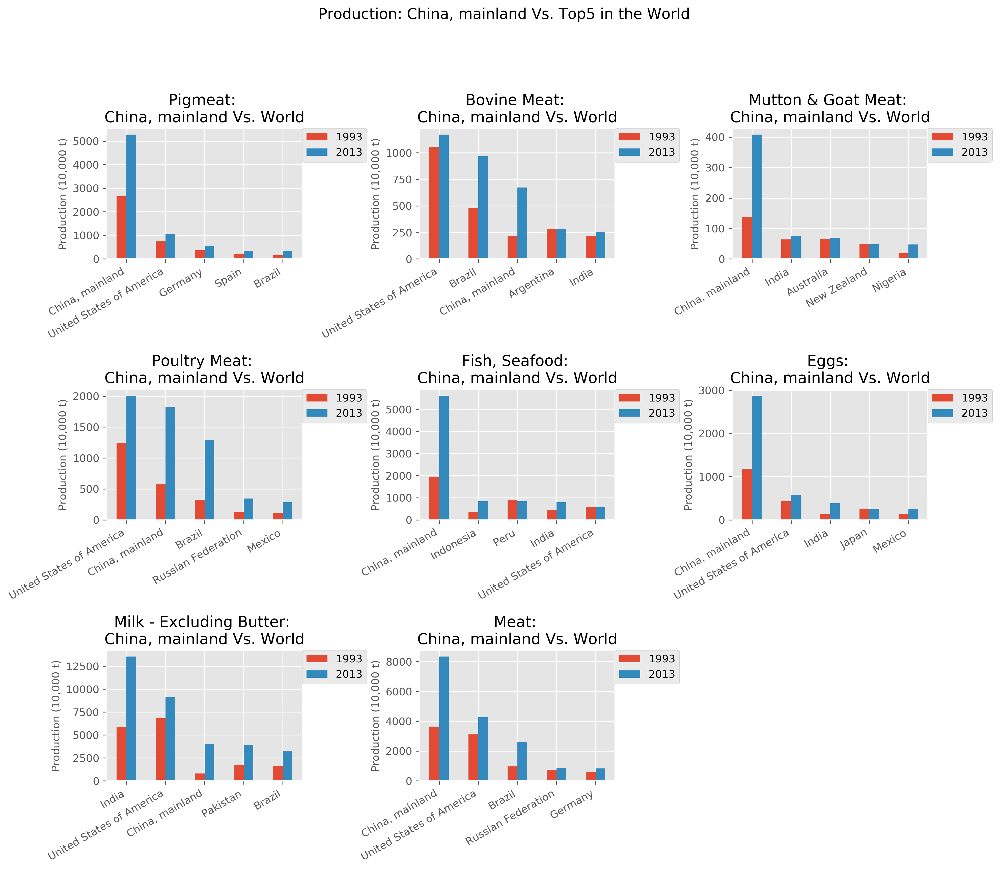

In [26]:
items=ITEMs.copy()
items.append('Meat')
mkDataMaps(D, A, E, items=items, toUnit='10,000 t', changeUnit=1/10000)

### 4. Main Contribution of an Area

In [27]:
# 设置主要贡献方面
ITEMs_main = ['Pigmeat', 'Fish, Seafood', 'Eggs']

In [28]:
def mkPVs_AG(
    domain,
    area,
    element,
    items_group='',
    items=[],
    group='World',
):
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
    
    pivots={}
    n=0
    for i in items:
        n+=1
        pivots[i]=PVs[domain][area][element][i][PVs[domain][area][element][i].index.isin([area,group])].transpose().copy()
        pivots[i].index.names = ['Year']
#         print(i)
#         display(pivots[i].tail(2))
        
    pivot_A=pd.DataFrame()
    for i in items:
        pivot_A = pd.concat([pivot_A, pivots[i][area]], axis=1)
    pivot_A.columns=items
#     print(area)
#     display(pivot_A.tail(2))
        
    pivot_G=pd.DataFrame()
    for i in items:
        pivot_G = pd.concat([pivot_G, pivots[i][group]], axis=1)
    pivot_G.columns=items
#     print(group)
#     display(pivot_G.tail(2))

    pivots_AG={
        (area,group):pivots,
        area:pivot_A,
        group:pivot_G,
    }
    return pivots_AG

In [30]:
def proportion_AG(
    domain,
    area,
    element,
    items_group='',
    items=[],
    group='World',
    other='Other Areas',
    toUnit='',
    changeUnit=1,
    kind='area',
):        
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
    
    PVs_AG[domain]={}
    PVs_AG[domain][area]={}
    PVs_AG[domain][area][element]=mkPVs_AG(domain, area, element,items=items)

    fig_row=(len(items)+1)//2
    fig_size=(14,fig_row*4)
    
    if kind=='area':alpha=0.4
    else:alpha=1

    # ===========================================================
    fig = plt.figure(figsize = fig_size,dpi=300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.2, hspace =0.3)
    plt.suptitle("{}: {} Vs. {}".format(element, area, group), fontsize=TIT_size)
    
    n=0
    for i in items:
        n+=1
        ax = fig.add_subplot(fig_row,2,n)
        plt.title(i, fontsize=TIT_size)
        df = PVs_AG[domain][area][element][(area,group)][i].copy()
        df=df*changeUnit
        df.plot(kind=kind,stacked=False, alpha=alpha, ax=plt.gca())

        ax=plt.gca()
        ax.legend(fontsize=13, loc='upper left')

        X_step=5
        setX_quant(ax, Years[::X_step], X_step)

        Y_max=df.values.max()
        if toUnit=='': Y_label = element
        else: 
            if '(' in element: Y_label = element[:element.find('(')] + '({})'.format(toUnit)
            else:Y_label=element+' ({})'.format(toUnit)
        setY_quant(ax, 1.5*Y_max, Y_label)
    
    img='./results/img/FAO_LivestockFish_CommodityBalance/FAO_{}_{}_VsWorld_{}.png'.format(domain, element[:element.find('/')],items_group)
    bbox = matplotlib.transforms.Bbox([[-0, -0], list(fig_size)])
    fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)

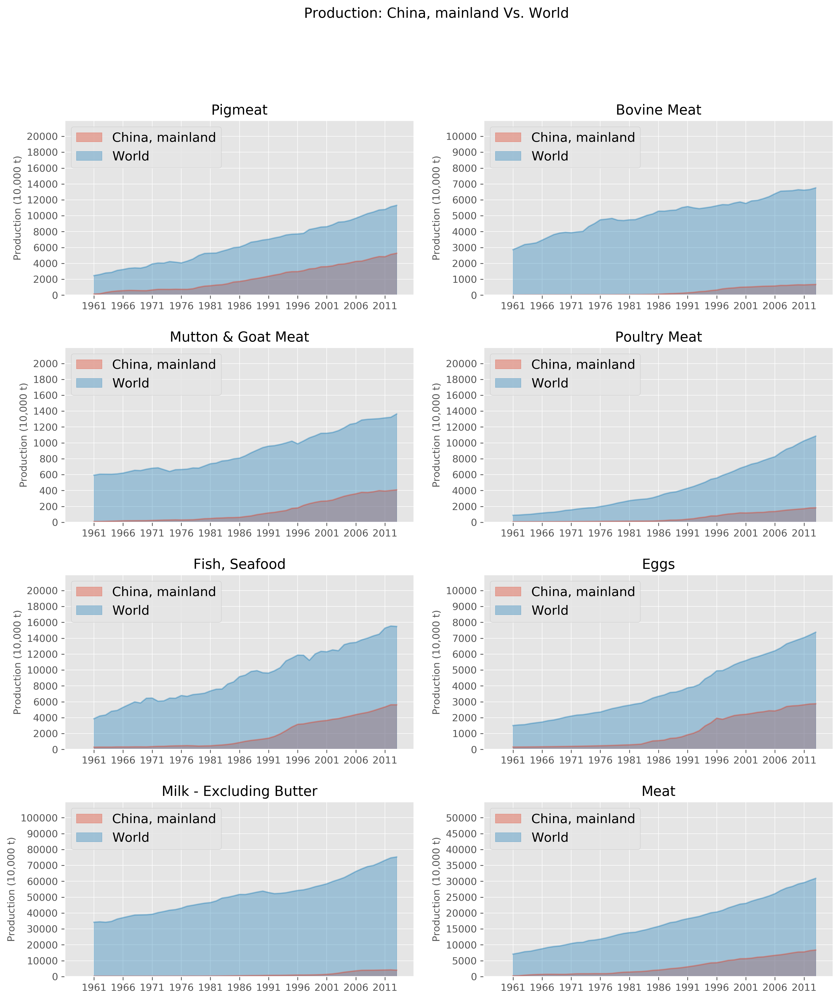

In [31]:
items = ITEMs.copy()
items.append('Meat')
proportion_AG(D,A,E, items=items, toUnit='10,000 t', changeUnit=1/10000, kind='area')

In [32]:
def pi_AG(
    domain,
    area,
    element,
    items_group='',
    items=[],
    years=[],
    group='World',
    other='Other Area',
    colors=[],
    fig_size=(14,7),
):
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
                
    if years==[]:years=[Years[0],Years[-1]]
    
    if colors==[]: colors=CLs
    else: colors=colors
        
    # plot all items in the world...
    
    fig = plt.figure(figsize = fig_size,dpi=300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.2, hspace =0.1)
    plt.suptitle("Percentages of {}'s Different Items\nand the Proportions of {} in the {}".format(element, area, group), fontsize=TIT_size)

    fig_no=0
    for y in years:
        fig_no+=1

        df=pd.concat([PVs_AG[domain][area][element][area].loc[y],
                      PVs_AG[domain][area][element][group].loc[y]],axis=1).copy()

        df=df[df.index.isin(items)]
        df.columns=[area,group]
        df[other] = df[group] - df[area]

        print(y)
#         print(Unit)
        display(df)

        ax = fig.add_subplot(1,2, fig_no)
        plt.title(y, fontsize=TIT_size)

        size = 0.5
        outer_radius = 2
        inner_colors = ['r', 'lightgray', 'r', 'lightgray', 'r', 'lightgray', 'r', 'lightgray']

        outer_explode = np.zeros(len(items))
        inner_explode = np.zeros(len(items*2))

        for n in range(len(items)):
            if items[n] in ITEMs_main:
                outer_explode[n] = 0.15
                inner_explode[2*n] = 0.15

        area_pct = ['{}{}'.format(int(df.loc[i][area]/df.loc[i][group]*100),'%') for i in df.index.values]
        inner_labels = []
        for i in area_pct:
            inner_labels.append(i)
            inner_labels.append('')

        fontsize = 14
        shadow = False
        startangle = 0
        plt.pie(df[group].values, 
                autopct='%1.0f%%',
                pctdistance=1.06,
                explode=list(outer_explode),
                radius=outer_radius, 
                colors=colors,
                center = (0,0),
                textprops = {'fontsize':fontsize}, 
                wedgeprops=dict(width=size),
                shadow=shadow,
                startangle=startangle,
                )
        plt.pie(df[[area,other]].values.flatten(), 
                labels=inner_labels,
                labeldistance = 0.8,
                explode=list(inner_explode),
                radius=outer_radius-size, 
                colors=inner_colors,
                center = (0,0),
                textprops = {'fontsize':fontsize}, 
                wedgeprops=dict(width=size),
                shadow=shadow,
                startangle=startangle,
               )
        plt.axis('equal')          # equal 使得为正圆

    ax=plt.gca()
    ax.legend(labels=list(df.index.values)+[area,other],frameon=False,fontsize=LEG_size, 
              loc='lower center',bbox_to_anchor=(-0.05,0.),borderaxespad = 0.)
    
    img='./results/img/FAO_{}_{}_VsWorldPi_{}.png'.format(domain, element[:element.find('/')],items_group)
    bbox = matplotlib.transforms.Bbox([[-0, -0], list(fig_size)])
    fig.tight_layout()
    fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)

1961


,"China, mainland",World,Other Area
Pigmeat,1370000.0,24665837.0,23295837.0
Bovine Meat,59500.0,28660524.0,28601024.0
Mutton & Goat Meat,100000.0,5931883.0,5831883.0
Poultry Meat,622000.0,8893281.0,8271281.0
"Fish, Seafood",2835600.0,38761665.0,35926065.0
Eggs,1500000.0,15068429.0,13568429.0
Milk - Excluding Butter,1833000.0,342266800.0,340433800.0


2013


,"China, mainland",World,Other Area
Pigmeat,52733000.0,113067907.0,60334907.0
Bovine Meat,6730000.0,67540429.0,60810429.0
Mutton & Goat Meat,4081000.0,13640039.0,9559039.0
Poultry Meat,18264900.0,108516798.0,90251898.0
"Fish, Seafood",56228526.0,154848221.0,98619695.0
Eggs,28760000.0,73785370.0,45025370.0
Milk - Excluding Butter,40193200.0,753035981.0,712842781.0


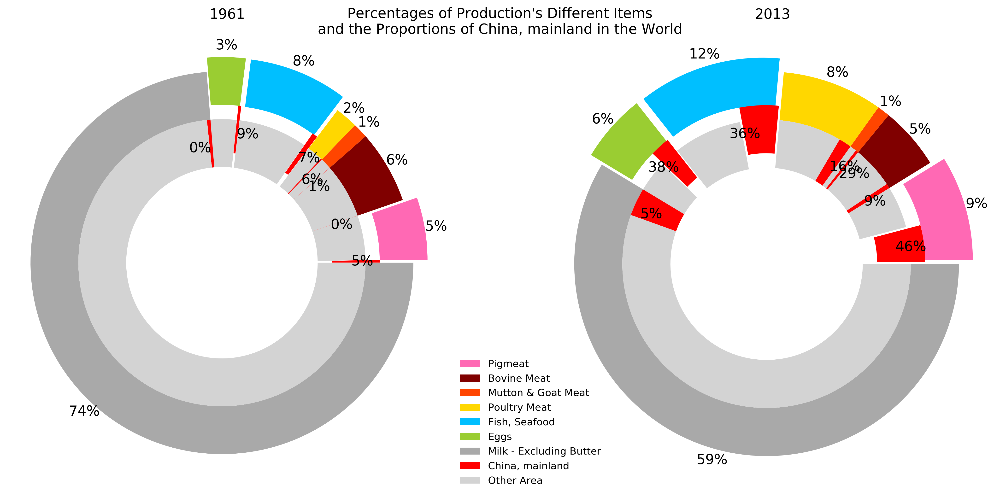

In [33]:
pi_AG(D,A,E)

# 'Import Quantity'

{'CommodityBalances_LivestockFish': {'China, mainland': {'Production': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Import Quantity': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}}}}
['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']
['Bovin

,1961,2013
Pigmeat,48.0,6.0
Bovine Meat,146.0,8.0
Mutton & Goat Meat,101.0,1.0
Poultry Meat,115.0,7.0
"Fish, Seafood",146.0,1.0
Eggs,114.0,133.0
Milk - Excluding Butter,135.0,2.0


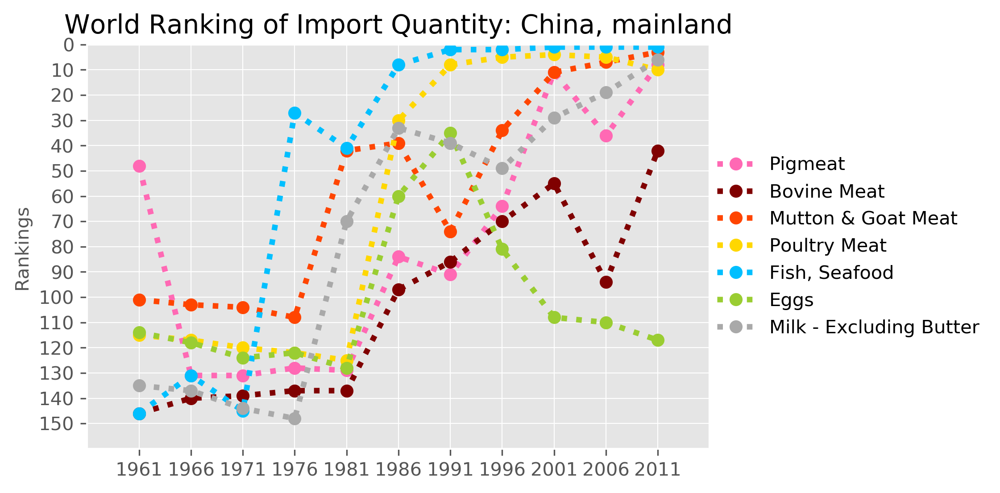

In [34]:
E = 'Import Quantity'
toUnit = '10,000 t'
changeUnit = 1/10000

# 生成条件
CDTs[D][A][E] = Is
print(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs[D]={}
PVs[D][A]={}
PVs[D][A][E] = mkPVs_Area_Year(D, A, E, IsGroup)

# for i, pv in PVs[D][A][E].items():
#         print(Unit)
#     display(E, i, pv.tail(2))

# 根据需要设置items和颜色
ranking_AreaItemInWorld(D,A,E,rank_max=150)

items = ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats']


,Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Offals,Animal fats
Year,,,,,,
2009,104.8565,934.2316,0.0168,229.5658,39.7958,56.7939
2010,93.8935,845.0838,0.0368,368.8691,71.1871,57.6070
2011,117.3311,967.5309,0.0406,413.2399,89.0950,73.6154
2012,144.6653,932.9840,0.0218,567.7579,84.7778,70.7331
2013,205.3809,932.9840,0.0179,820.6767,83.6207,49.8380


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Meat, Other"
Year,,,,,
2009,20.5316,2.0894,6.6466,74.9720,0.6169
2010,29.4371,3.2973,5.6968,54.2464,1.2159
2011,63.3089,2.7893,8.3144,42.1170,0.8016
2012,71.4522,8.5063,12.3939,52.1850,0.1279
2013,81.4674,39.4137,25.8723,58.4195,0.2081


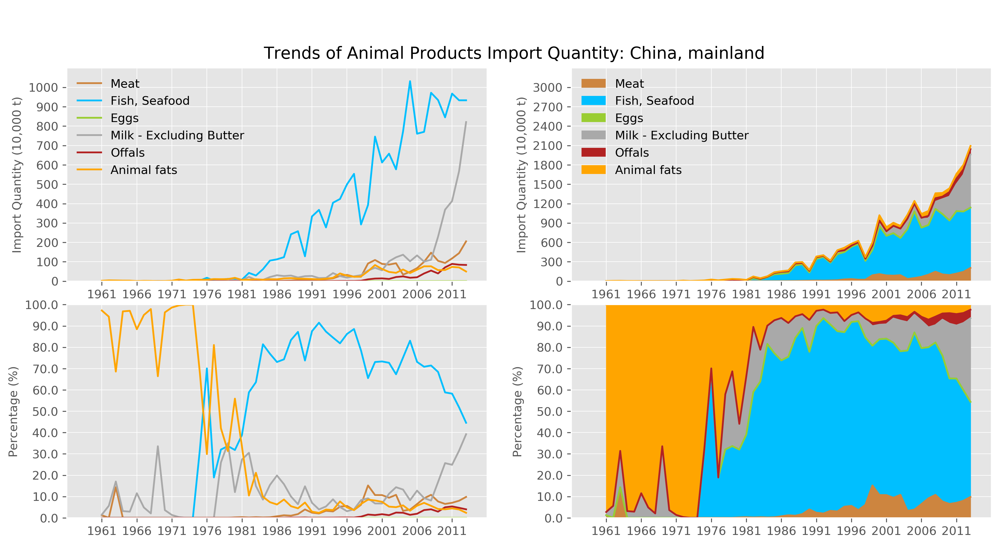

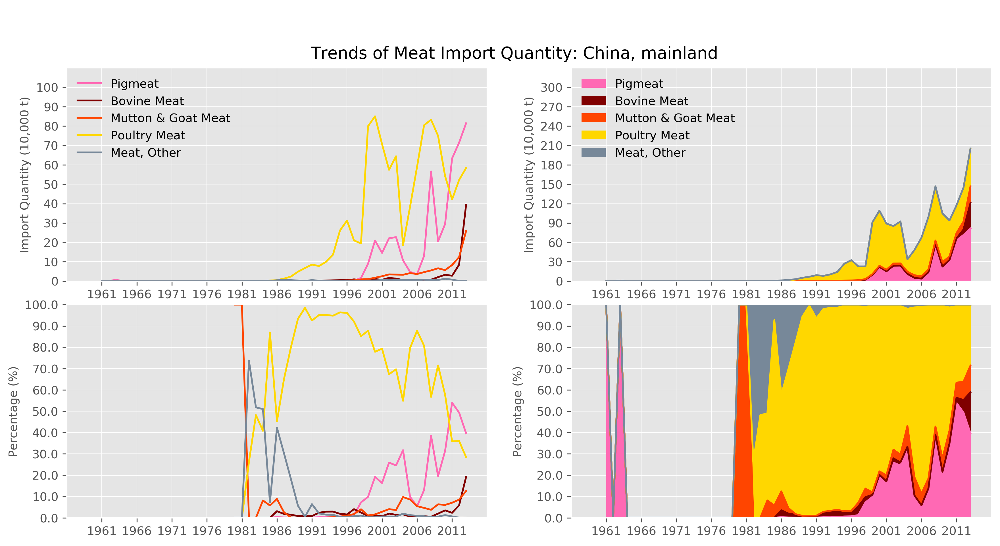

In [36]:
# # 所有主要末梢类别, 加上末梢不重要但总类重要的总类
# plotTrends(D, A, E, toUnit='10,000 t', changeUnit = 1/10000)

# 可以观察pivot决定是否增设 items group, 并设置颜色

# 重要总类的分类
plotTrends(D, A, E, items_group='Animal Products', 
           toUnit='10,000 t', changeUnit = 1/10000,
           colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
          )
plotTrends(D, A, E, items_group='Meat', 
           toUnit='10,000 t', changeUnit = 1/10000,
           colors=[cpig,ccattle,cgoat,cbirds,cother],
          )

,1993,2013
Area,,
Japan,50.3044,136.3412
Germany,98.8305,118.6776
Italy,64.8226,107.8858
United Kingdom,51.0695,104.7276
Russian Federation,41.5039,91.8641
"China, mainland",0.0344,81.4674


Import Quantity (10,000 t), Pigmeat, 1993
Import Quantity (10,000 t), Pigmeat, 2013


,1993,2013
Area,,
United States of America,115.5684,111.2529
Russian Federation,65.8742,80.6603
Japan,68.8828,68.3770
Italy,43.1650,46.6859
United Kingdom,31.1371,44.5852
"China, mainland",0.3054,39.4137


Import Quantity (10,000 t), Bovine Meat, 1993
Import Quantity (10,000 t), Bovine Meat, 2013


,1993,2013
Area,,
"China, mainland",0.0106,25.8723
France,16.1346,10.3465
United Kingdom,10.6560,9.8917
United States of America,2.4331,8.5367
Saudi Arabia,3.2922,5.1272


Import Quantity (10,000 t), Mutton & Goat Meat, 1993
Import Quantity (10,000 t), Mutton & Goat Meat, 2013


,1993,2013
Area,,
"China, Hong Kong SAR",36.2628,118.5857
Japan,43.5734,105.6260
Saudi Arabia,16.9974,87.9391
Mexico,19.2056,84.8565
United Kingdom,18.8340,81.1889
"China, mainland",9.9747,58.4195


Import Quantity (10,000 t), Poultry Meat, 1993
Import Quantity (10,000 t), Poultry Meat, 2013


,1993,2013
Area,,
"China, mainland",277.2741,932.9840
United States of America,347.3976,503.2992
Japan,462.1199,434.3308
Nigeria,43.7720,275.5023
Germany,227.7388,262.7458


Import Quantity (10,000 t), Fish, Seafood, 1993
Import Quantity (10,000 t), Fish, Seafood, 2013


,1993,2013
Area,,
Germany,22.3141,46.3892
Iraq,0.3000,29.4308
Netherlands,5.0317,24.3800
United Kingdom,2.2393,12.2346
"China, Hong Kong SAR",8.2729,11.4223
"China, mainland",0.1243,0.0179


Import Quantity (10,000 t), Eggs, 1993
Import Quantity (10,000 t), Eggs, 2013


,1993,2013
Area,,
Germany,536.3072,833.1570
"China, mainland",16.9337,820.6767
Italy,643.8559,769.5071
United Kingdom,221.1882,595.2571
United States of America,426.9944,523.4749


Import Quantity (10,000 t), Milk - Excluding Butter, 1993
Import Quantity (10,000 t), Milk - Excluding Butter, 2013


,1993,2013
Area,,
Japan,171.7635,312.8840
United Kingdom,112.2313,250.2419
Germany,188.8321,249.8035
Russian Federation,126.7355,228.6117
"China, mainland",10.4828,205.3809


Import Quantity (10,000 t), Meat, 1993
Import Quantity (10,000 t), Meat, 2013


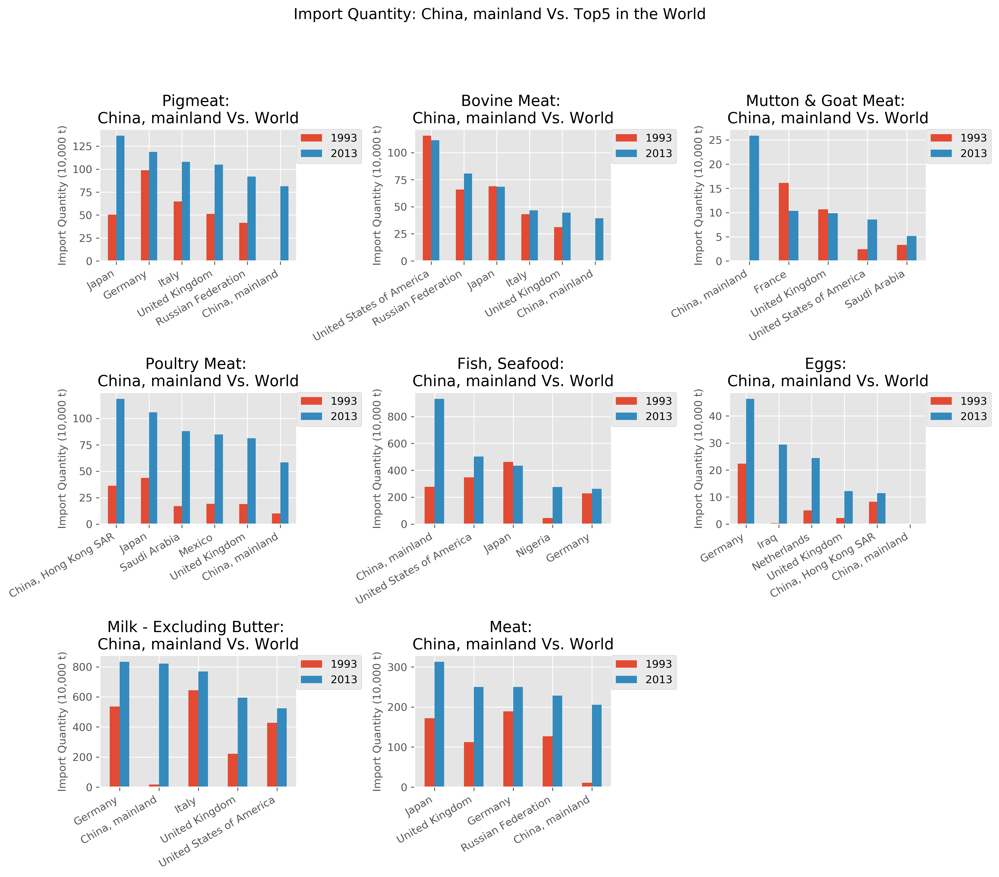

In [37]:
items=ITEMs.copy()
items.append('Meat')
mkDataMaps(D, A, E, items=items, toUnit='10,000 t', changeUnit=1/10000)

1983


,"China, mainland",World,Other Area
Pigmeat,0.0,2932675.0,2932675.0
Bovine Meat,0.0,4501721.0,4501721.0
Mutton & Goat Meat,0.0,792495.0,792495.0
Poultry Meat,640.0,1574475.0,1573835.0
"Fish, Seafood",291840.0,21933655.0,21641815.0
Eggs,0.0,923410.0,923410.0
Milk - Excluding Butter,68451.0,50610747.0,50542296.0


2013


,"China, mainland",World,Other Area
Pigmeat,814674.0,14894420.0,14079746.0
Bovine Meat,394137.0,10044667.0,9650530.0
Mutton & Goat Meat,258723.0,1071029.0,812306.0
Poultry Meat,584195.0,15112527.0,14528332.0
"Fish, Seafood",9329840.0,60313073.0,50983233.0
Eggs,179.0,2553964.0,2553785.0
Milk - Excluding Butter,8206767.0,116805421.0,108598654.0


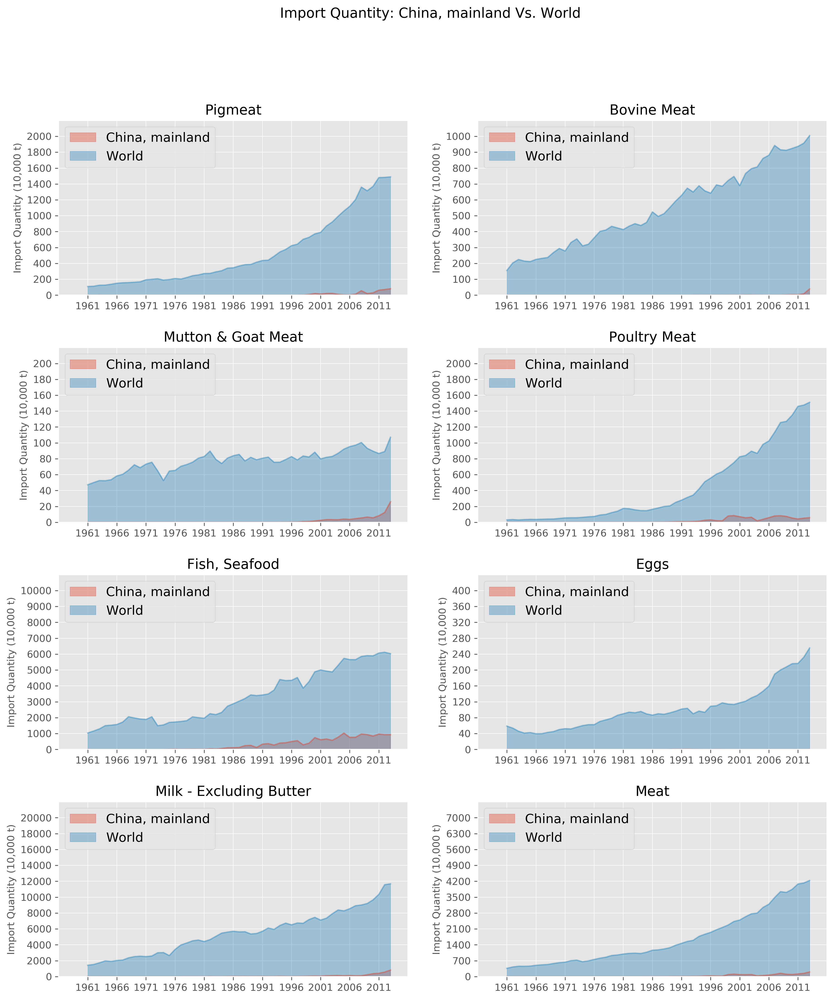

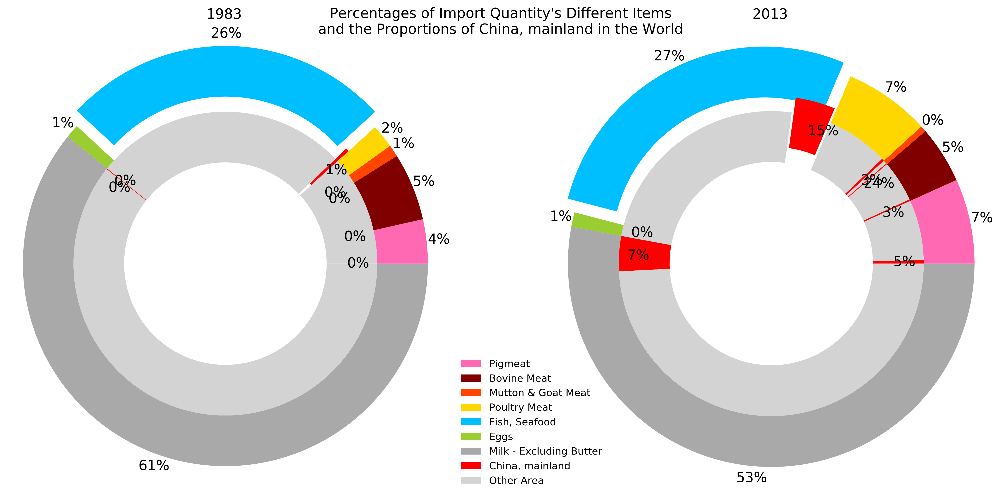

In [38]:
ITEMs_main=['Fish, Seafood']

items=ITEMs.copy()
items.append('Meat')
proportion_AG(D,A,E,items=items, toUnit='10,000 t',changeUnit=1/10000, kind='area')

pi_AG(D,A,E,years=[Years[-1]-30,Years[-1]])

# 'Export Quantity'

{'CommodityBalances_LivestockFish': {'China, mainland': {'Production': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Import Quantity': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Export Quantity': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'M

,1961,2013
Pigmeat,11.0,12.0
Bovine Meat,111.0,29.0
Mutton & Goat Meat,91.0,19.0
Poultry Meat,8.0,8.0
"Fish, Seafood",117.0,1.0
Eggs,10.0,9.0
Milk - Excluding Butter,58.0,55.0


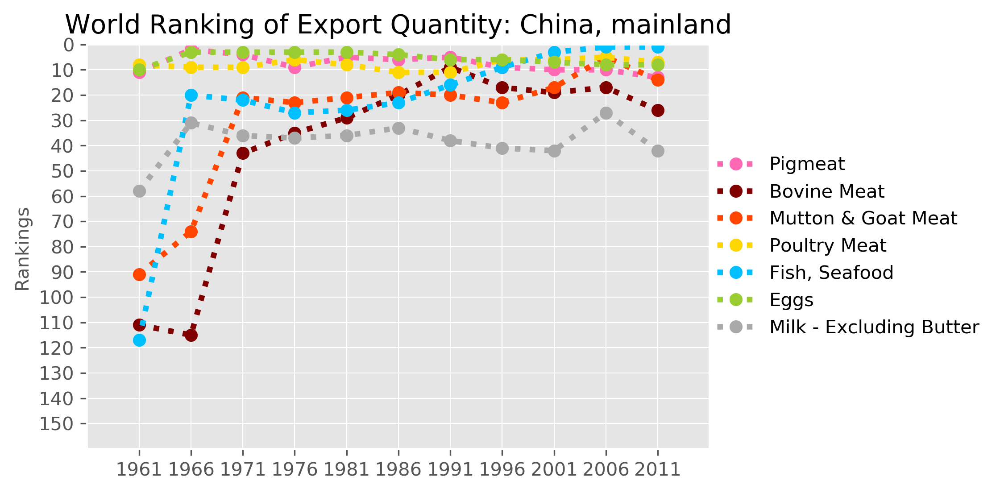

In [41]:
E = 'Export Quantity'
toUnit = '10,000'
changeUnit = 1/10000

# 生成条件
CDTs[D][A][E] = Is
print(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs[D]={}
PVs[D][A]={}
PVs[D][A][E] = mkPVs_Area_Year(D, A, E, IsGroup)

# for i, pv in PVs[D][A][E].items():
#         print(Unit)
#     display(E, i, pv.tail(2))

# 根据需要设置items和颜色
ranking_AreaItemInWorld(D,A,E,rank_max=150)

items = ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats']


,Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Offals,Animal fats
Year,,,,,,
2009,76.7058,625.9197,14.5795,14.9303,0.0603,2.8114
2010,90.1804,738.0369,11.0158,19.0085,0.1099,3.2628
2011,91.7561,829.0502,10.8222,23.7493,0.1386,4.7234
2012,94.4479,717.0465,10.8398,25.9764,0.1707,3.7291
2013,90.0748,717.0465,9.7837,12.8885,0.9668,3.2609


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Meat, Other"
Year,,,,,
2009,26.3532,8.5996,0.9532,38.5840,2.2158
2010,31.7968,5.5291,1.3481,49.1647,2.3418
2011,27.6404,6.0087,0.8118,55.2148,2.0804
2012,26.2105,10.1888,0.5044,55.3811,2.1632
2013,27.9497,3.4658,0.3215,56.3993,1.9386


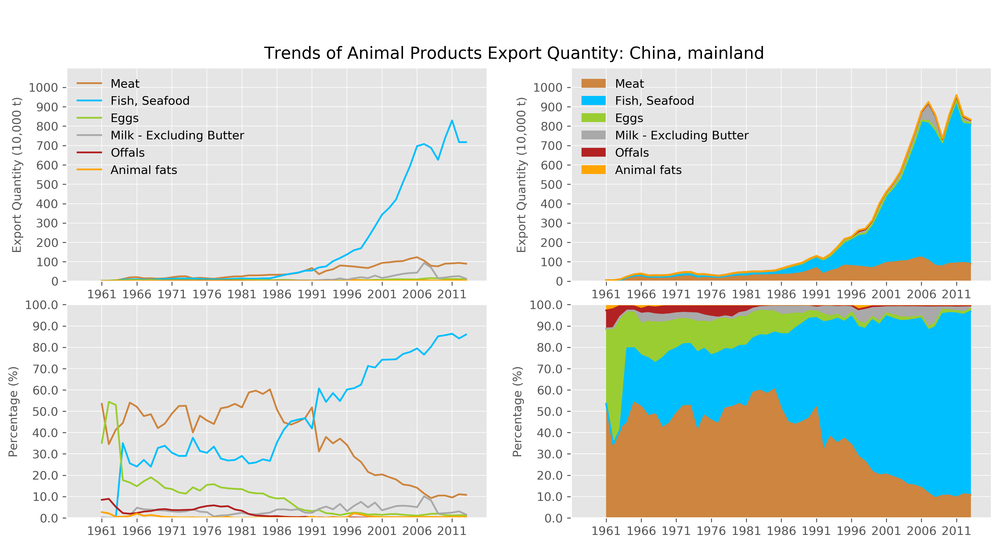

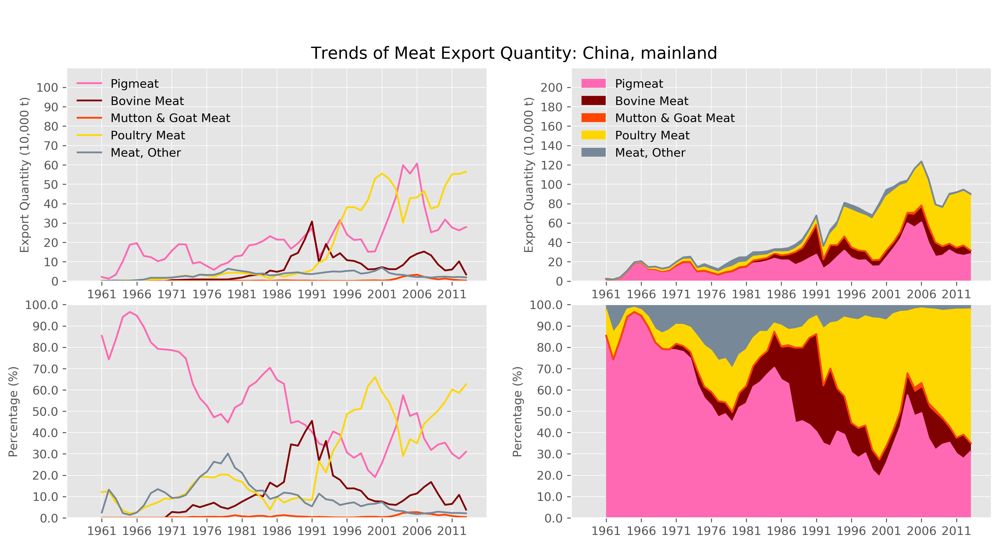

In [40]:
# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
# plotTrends(D, A, E, toUnit='10,000 t', changeUnit = 1/10000)

# 可以观察pivot决定是否增设 items group, 并设置颜色

# 重要总类的分类
plotTrends(D, A, E, items_group='Animal Products', 
           toUnit='10,000 t', changeUnit = 1/10000,
           colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
          )
plotTrends(D, A, E, items_group='Meat', 
           toUnit='10,000 t', changeUnit = 1/10000,
           colors=[cpig,ccattle,cgoat,cbirds,cother],
          )

,1993,2013
Area,,
Germany,23.2918,240.7126
United States of America,18.8017,228.9406
Denmark,110.1488,144.6941
Spain,7.3050,128.7725
Canada,29.6748,126.2754
"China, mainland",17.8237,27.9497


Export Quantity (10,000 t), Pigmeat, 1993
Export Quantity (10,000 t), Pigmeat, 2013


,1993,2013
Area,,
Brazil,44.3348,186.8135
India,10.1802,155.9423
Australia,108.5231,153.7728
United States of America,61.9563,124.5021
New Zealand,44.2963,54.0657
"China, mainland",19.1438,3.4658


Export Quantity (10,000 t), Bovine Meat, 1993
Export Quantity (10,000 t), Bovine Meat, 2013


,1993,2013
Area,,
Australia,22.1186,44.9705
New Zealand,35.9144,39.8551
United Kingdom,10.7924,10.3464
Ireland,6.4049,4.2595
Spain,0.5365,3.4440
"China, mainland",0.1917,0.3215


Export Quantity (10,000 t), Mutton & Goat Meat, 1993
Export Quantity (10,000 t), Mutton & Goat Meat, 2013


,1993,2013
Area,,
United States of America,107.3785,408.6159
Brazil,52.5907,390.2419
Netherlands,40.3396,113.8189
"China, Hong Kong SAR",16.9738,80.5527
Germany,8.6542,67.6184
"China, mainland",11.2769,56.3993


Export Quantity (10,000 t), Poultry Meat, 1993
Export Quantity (10,000 t), Poultry Meat, 2013


,1993,2013
Area,,
"China, mainland",76.0347,717.0465
Peru,764.7868,622.3122
Norway,189.6710,289.5180
Thailand,128.4468,266.5796
United States of America,150.6994,263.1018


Export Quantity (10,000 t), Fish, Seafood, 1993
Export Quantity (10,000 t), Fish, Seafood, 2013


,1993,2013
Area,,
Netherlands,41.8254,65.4677
Turkey,0.0667,28.1400
United States of America,10.6460,26.8653
Poland,0.0180,24.7605
Germany,5.0194,15.2164
"China, mainland",3.1006,9.7837


Export Quantity (10,000 t), Eggs, 1993
Export Quantity (10,000 t), Eggs, 2013


,1993,2013
Area,,
New Zealand,605.9518,1894.4464
Germany,1195.5285,1567.7259
United States of America,184.8038,1075.6405
Netherlands,826.2105,1071.4369
France,716.1488,1008.4225
"China, mainland",7.4081,12.8885


Export Quantity (10,000 t), Milk - Excluding Butter, 1993
Export Quantity (10,000 t), Milk - Excluding Butter, 2013


,1993,2013
Area,,
United States of America,193.3485,763.0142
Brazil,103.3692,652.9352
Germany,88.6834,352.0075
Netherlands,173.8960,284.5708
Australia,133.3755,207.8132
"China, mainland",53.0610,90.0748


Export Quantity (10,000 t), Meat, 1993
Export Quantity (10,000 t), Meat, 2013


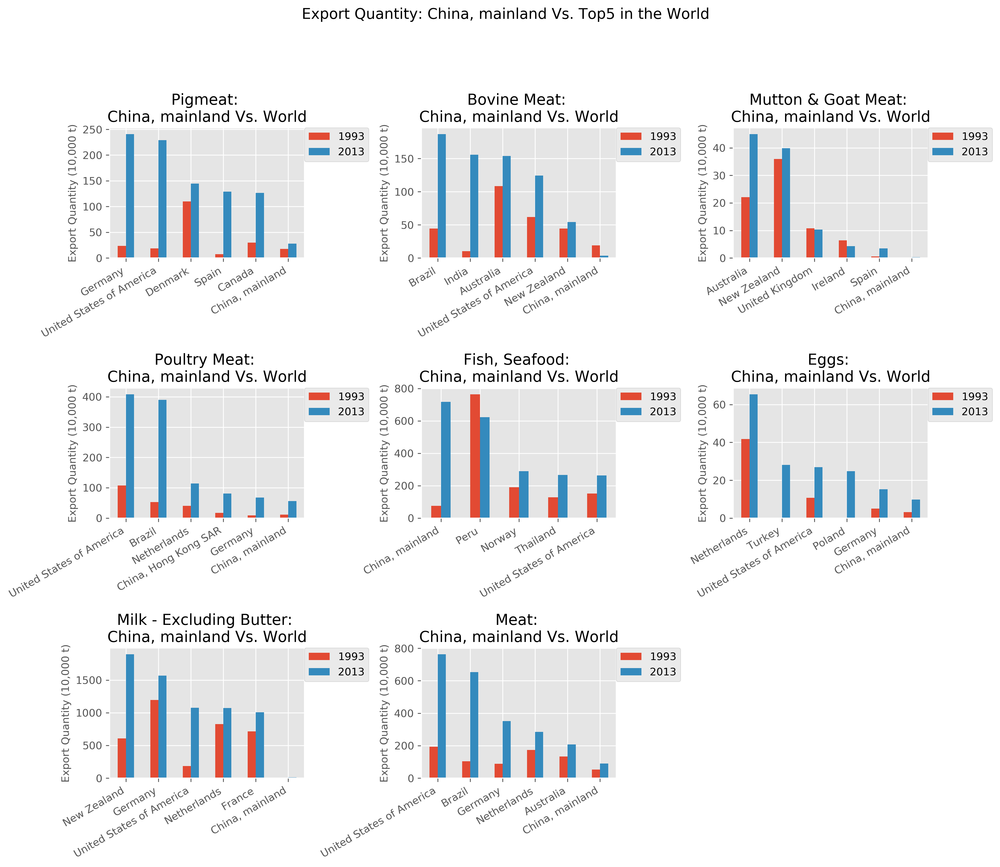

In [42]:
items=ITEMs.copy()
items.append('Meat')
mkDataMaps(D, A, E, items=items, toUnit='10,000 t', changeUnit=1/10000)

1983


,"China, mainland",World,Other Area
Pigmeat,190488.0,3101128.0,2910640.0
Bovine Meat,32857.0,4899569.0,4866712.0
Mutton & Goat Meat,2600.0,911571.0,908971.0
Poultry Meat,35246.0,1764440.0,1729194.0
"Fish, Seafood",130467.0,21351048.0,21220581.0
Eggs,57777.0,915347.0,857570.0
Milk - Excluding Butter,8333.0,51027601.5,51019268.5


2013


,"China, mainland",World,Other Area
Pigmeat,279497.0,15451239.0,15171742.0
Bovine Meat,34658.0,11897179.0,11862521.0
Mutton & Goat Meat,3215.0,1209076.0,1205861.0
Poultry Meat,563993.0,16691240.0,16127247.0
"Fish, Seafood",7170465.0,54928278.0,47757813.0
Eggs,97837.0,2783594.0,2685757.0
Milk - Excluding Butter,128885.0,125098345.0,124969460.0


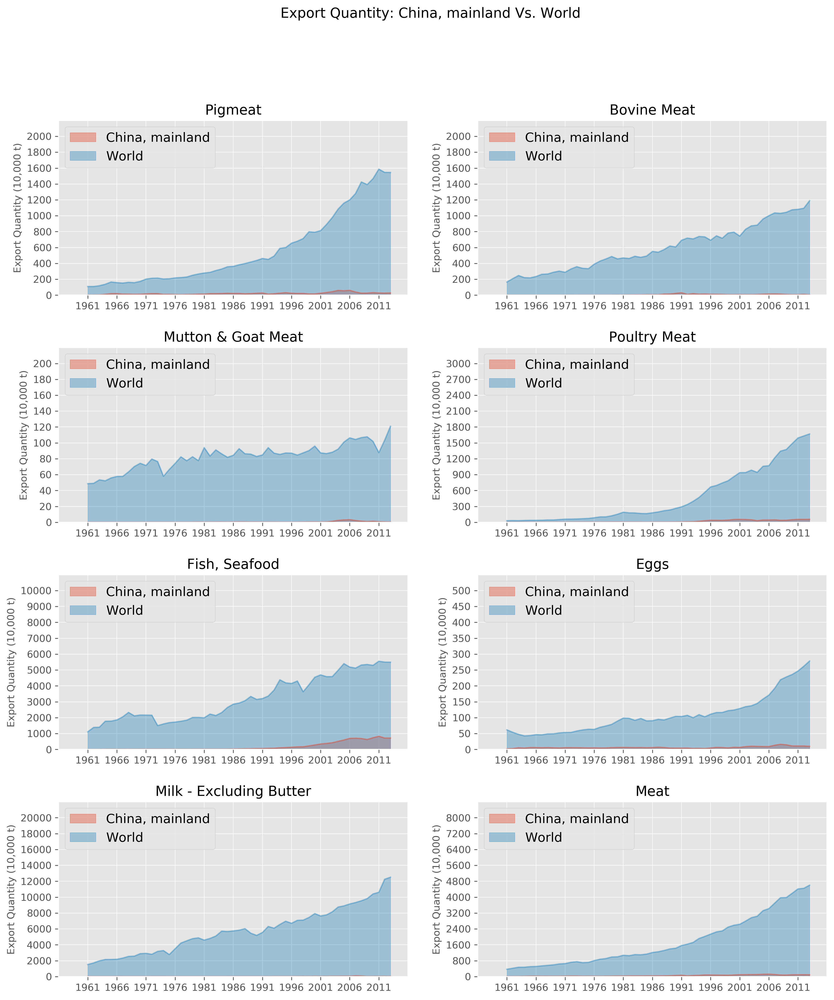

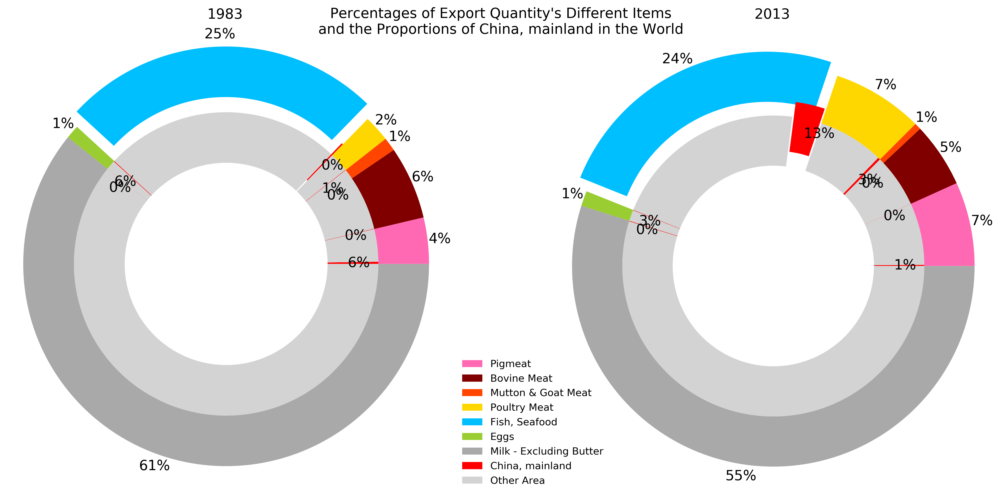

In [43]:
ITEMs_main=['Fish, Seafood']

items=ITEMs.copy()
items.append('Meat')
proportion_AG(D,A,E,items=items, toUnit='10,000 t',changeUnit=1/10000, kind='area')

pi_AG(D,A,E,years=[Years[-1]-30,Years[-1]])

# Domestic Supply Quantity Also Shown in Another File 'FAO_LivestockFish_FoodSupplyQuantity', They are the Same Data, Please Go Ahead There!

In [37]:
# E = 'Domestic supply quantity'
# toUnit = '10,000 t'
# changeUnit = 1/10000

# # 生成条件
# CDTs[D][A][E] = Is
# print(CDTs)

# # 生成主要末梢 (所有空值键 + 自定义键)
# items = []
# for i in CDTs[D][A][E]:
#     if CDTs[D][A][E][i]==[]: items.append(i)
# ITEMs=items
# print(ITEMs)

# # 设置 items group, 自动生成最终的 ITEMs
# ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
# print(ITEMs_all)
# items = []
# for i in ITEMs:
#     if i in ITEMs_all: items.append(i)
# ITEMs=items
# print(ITEMs)

# PVs[D]={}
# PVs[D][A]={}
# PVs[D][A][E] = mkPVs_Area_Year(D, A, E, IsGroup)

# for i, pv in PVs[D][A][E].items():
# #         print(Unit)
#     display(E, i, pv.tail(2))

# # 根据需要设置items和颜色
# ranking_AreaItemInWorld(D,A,E,rank_max=150)

items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,4687.6184,628.8898,389.5434,1631.2880,5173.6646,2727.9373,4219.2491
2010,4857.6403,651.6082,403.2487,1661.1817,5215.1522,2751.7210,4430.1425
2011,4876.3684,644.2805,400.6026,1695.7022,5499.6285,2800.6284,4532.9906
2012,5175.2417,660.6176,412.8895,1800.0599,5838.7902,2850.3820,4780.1915
2013,5326.8177,708.9479,433.6508,1828.5101,5838.7902,2866.2342,4827.1082


items = ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats']


,Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Offals,Animal fats
Year,,,,,,
2009,7487.0527,5173.6646,2727.9373,4219.2491,407.3105,394.6158
2010,7731.0371,5215.1522,2751.7210,4430.1425,459.1178,414.7799
2011,7780.7790,5499.6285,2800.6284,4532.9906,472.3916,427.9162
2012,8212.5474,5838.7902,2850.3820,4780.1915,473.8605,451.9018
2013,8461.4701,5838.7902,2866.2342,4827.1082,479.6820,439.5530


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Meat, Other"
Year,,,,,
2009,4687.6184,628.8898,389.5434,1631.2880,149.7131
2010,4857.6403,651.6082,403.2487,1661.1817,157.3581
2011,4876.3684,644.2805,400.6026,1695.7022,163.8252
2012,5175.2417,660.6176,412.8895,1800.0599,163.7387
2013,5326.8177,708.9479,433.6508,1828.5101,163.5435


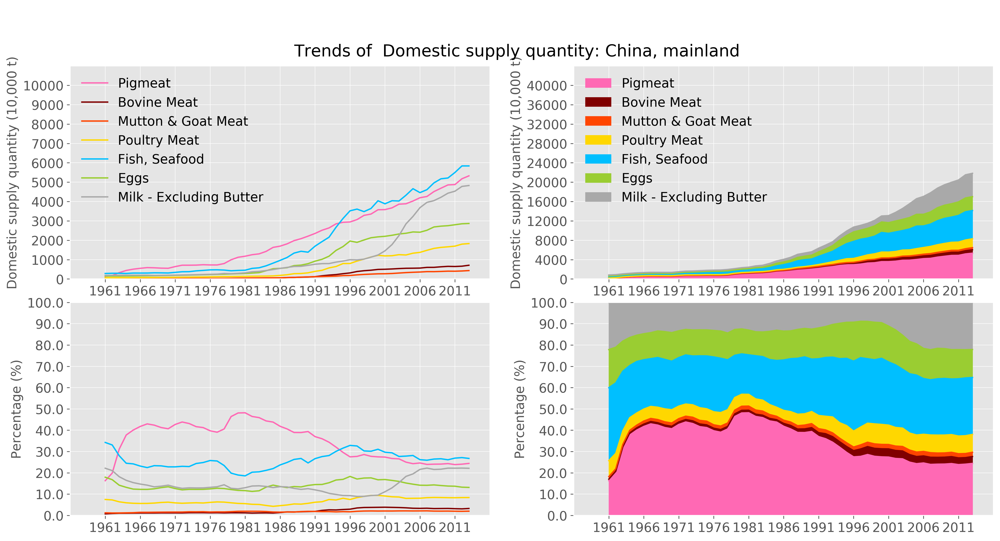

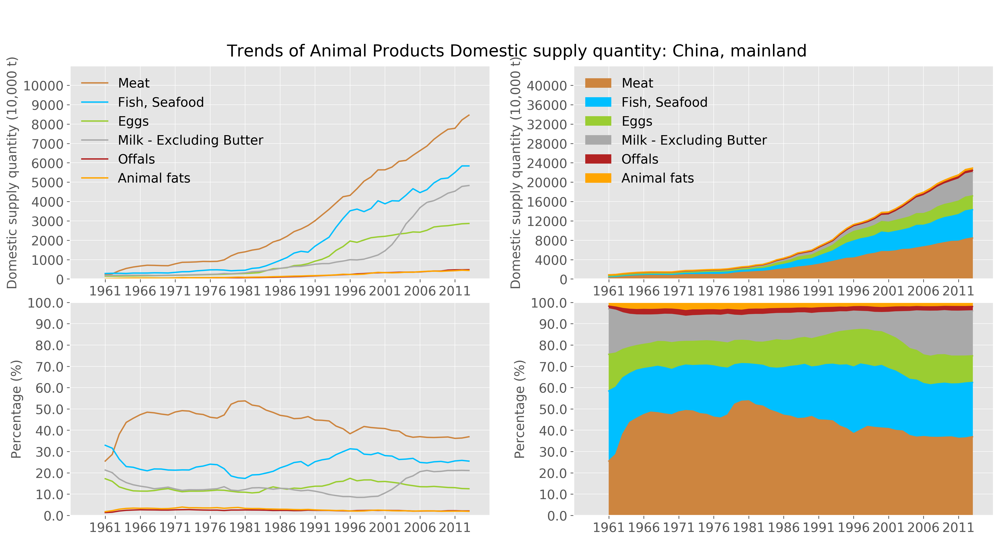

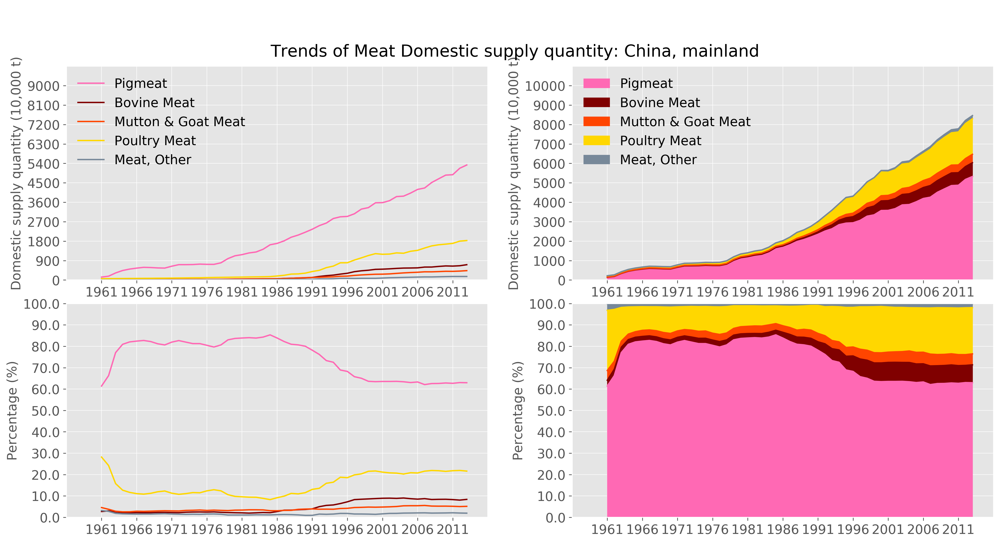

In [42]:
# # 所有主要末梢类别, 加上末梢不重要但总类重要的总类
# plotTrends(D, A, E, toUnit='10,000 t', changeUnit = 1/10000)

# # 可以设置颜色

# # 重要总类的分类
# plotTrends(D, A, E, items_group='Animal Products', 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
#           )
# plotTrends(D, A, E, items_group='Meat', 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cpig,ccattle,cgoat,cbirds,cother],
#           )

In [39]:
# items=ITEMs.copy()
# items.append('Meat')
# # mkDataMaps(D, A, E, items=items, toUnit='10,000 t', changeUnit=1/10000)

# proportion_AG(D,A,E,items=items, toUnit='10,000 t',changeUnit=1/10000, kind='area')

# ITEMs_main=['Pigmeat', 'Fish, Seafood', 'Eggs']
# pi_AG(D,A,E)

# 'Feed'

{'CommodityBalances_LivestockFish': {'China, mainland': {'Production': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Import Quantity': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Export Quantity': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'M

,1961,2013
Meat,10.0,7.0
"Fish, Seafood",99.0,1.0
Milk - Excluding Butter,36.0,13.0
Animal fats,68.0,52.0


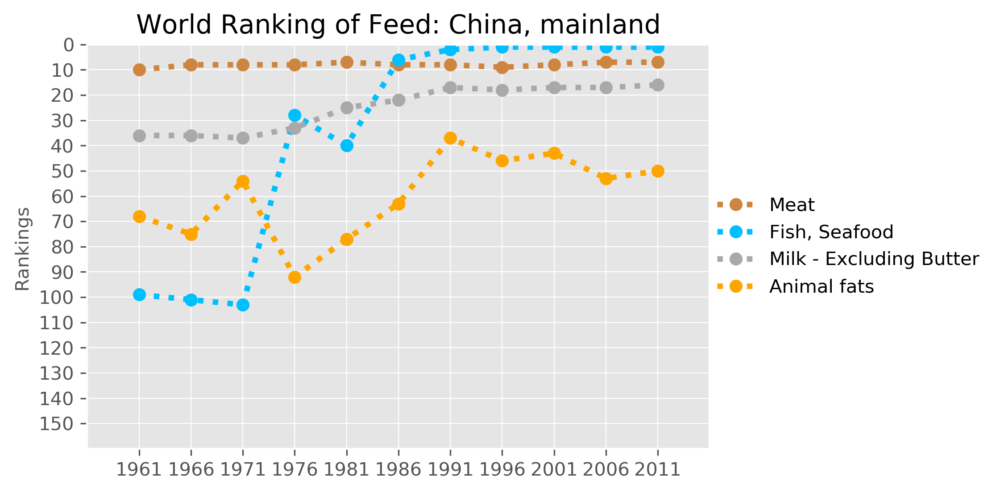

In [45]:
E = 'Feed'

# 生成条件
CDTs[D][A][E] = Is
print(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs[D]={}
PVs[D][A]={}
PVs[D][A][E] = mkPVs_Area_Year(D, A, E, IsGroup)

# for i, pv in PVs[D][A][E].items():
#     display(E, i, pv.tail(2))

# 需要根据结果试调items和颜色
ranking_AreaItemInWorld(D,A,E,items_group='Animal Products',rank_max=150,
                        colors=[cmeat,cfish,cmilk,cfat])

items = ['Meat', 'Fish, Seafood', 'Milk - Excluding Butter', 'Animal fats']


,Meat,"Fish, Seafood",Milk - Excluding Butter,Animal fats
Year,,,,
2009,0.0693,810.7915,133.2612,0.0092
2010,0.0715,727.6370,127.6939,0.0079
2011,0.0737,843.3110,133.9727,0.0100
2012,0.0737,863.4255,160.4302,0.0121
2013,0.0737,863.4255,160.8306,0.0121


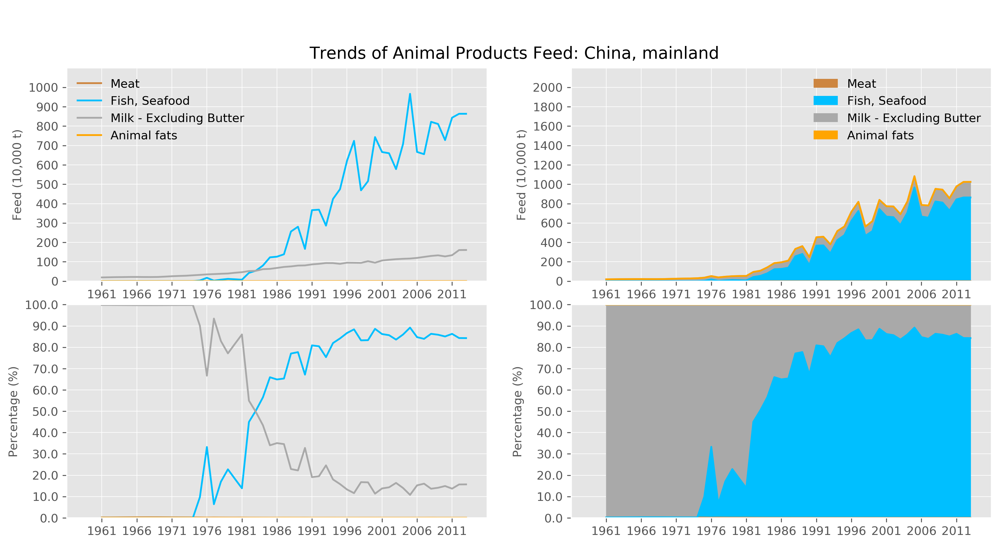

In [46]:
# 重要总类的分类
plotTrends(D, A, E, items_group='Animal Products', 
           toUnit='10,000 t', changeUnit = 1/10000,
           colors=[cmeat,cfish,cmilk,cfat],
          )

,1993,2013
Area,,
United States of America,1.5802,4.8944
Canada,0.5390,1.5968
Kazakhstan,1.1400,0.8500
Chile,0.3291,0.3808
South Africa,0.0960,0.1620
"China, mainland",0.0500,0.0737


Feed (10,000 t), Meat, 1993
Feed (10,000 t), Meat, 2013


,1993,2013
Area,,
"China, mainland",286.4425,863.4255
Japan,353.8163,170.9305
Norway,85.4534,148.1473
"China, Taiwan Province of",241.4663,93.8096
Indonesia,51.7324,83.1994


Feed (10,000 t), Fish, Seafood, 1993
Feed (10,000 t), Fish, Seafood, 2013


,1993,2013
Area,,
India,706.1951,2275.7355
Russian Federation,2667.1153,1066.2572
Uzbekistan,39.2911,412.5074
Ukraine,892.2063,314.9468
Turkey,140.7414,240.0790
"China, mainland",93.5666,160.8306


Feed (10,000 t), Milk - Excluding Butter, 1993
Feed (10,000 t), Milk - Excluding Butter, 2013


,1993,2013
Area,,
United States of America,118.1247,125.0000
Spain,13.5358,15.7752
Chile,12.5086,8.9934
"China, Taiwan Province of",4.3775,7.9617
Venezuela (Bolivarian Republic of),7.2995,5.9025
"China, mainland",0.0009,0.0121


Feed (10,000 t), Animal fats, 1993
Feed (10,000 t), Animal fats, 2013


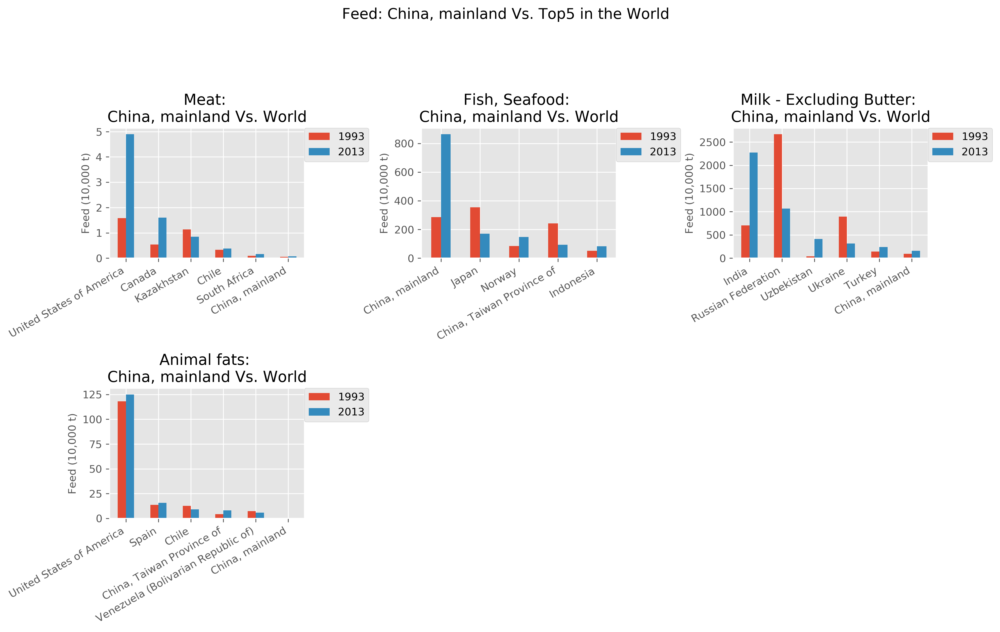

In [47]:
mkDataMaps(D, A, E, items_group='Animal Products', toUnit='10,000 t', changeUnit=1/10000)

1961


,"China, mainland",World,Other Area
Meat,352.0,34442.0,34090.0
"Fish, Seafood",0.0,9107331.0,9107331.0
Milk - Excluding Butter,192108.0,92035739.0,91843631.0
Animal fats,0.0,844516.0,844516.0


2013


,"China, mainland",World,Other Area
Meat,737.0,82495.0,81758.0
"Fish, Seafood",8634255.0,22220448.0,13586193.0
Milk - Excluding Butter,1608306.0,81973716.0,80365410.0
Animal fats,121.0,1956602.0,1956481.0


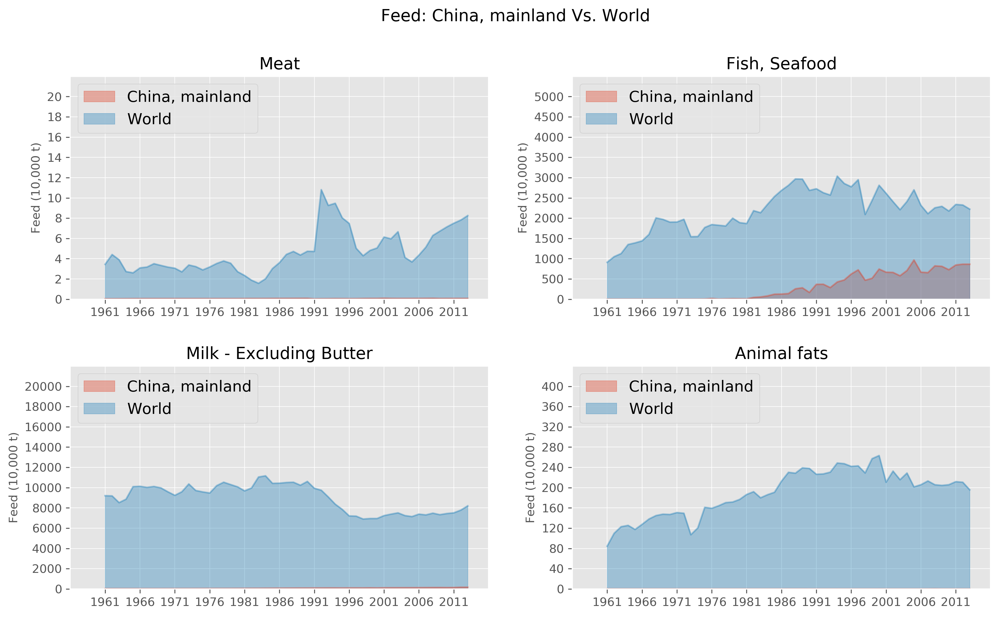

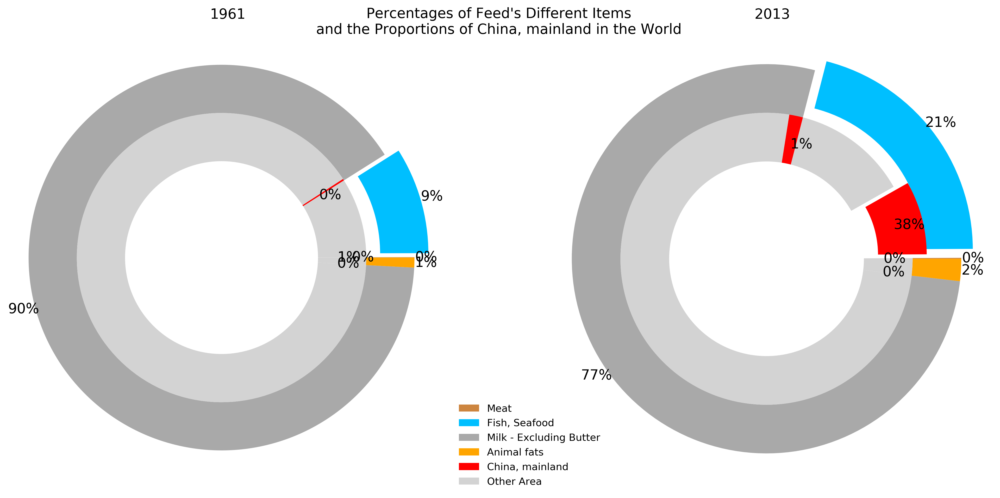

In [48]:
proportion_AG(D,A,E, items_group='Animal Products', toUnit='10,000 t', changeUnit=1/10000, kind='area')
pi_AG(D,A,E,items_group='Animal Products',colors=[cmeat,cfish,cmilk,cfat])

In [57]:
# E = 'Other uses'

# # 生成条件
# CDTs[D][A][E] = Is
# print(CDTs)

# # 生成主要末梢 (所有空值键 + 自定义键)
# items = []
# for i in CDTs[D][A][E]:
#     if CDTs[D][A][E][i]==[]: items.append(i)
# ITEMs=items
# print(ITEMs)

# # 设置 items group, 自动生成最终的 ITEMs
# ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
# print(ITEMs_all)
# items = []
# for i in ITEMs:
#     if i in ITEMs_all: items.append(i)
# ITEMs=items
# print(ITEMs)

# PVs[D]={}
# PVs[D][A]={}
# PVs[D][A][E] = mkPVs_Area_Year(D, A, E, IsGroup)

# for i, pv in PVs[D][A][E].items():
#     display(E, i, pv.tail(2))

# # 需要根据结果试调items和颜色
# ranking_AreaItemInWorld(D,A,E,items_group='Animal Products',rank_max=150,
#                         colors=[cmeat,cfish,cmilk,cfat])

In [56]:
# # 重要总类的分类
# plotTrends(D, A, E, items_group='Animal Products', 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cfish,cegg,coffal,cfat,],
#           )

In [54]:
# E = 'Losses'

# # 生成条件
# CDTs[D][A][E] = Is
# print(CDTs)

# # 生成主要末梢 (所有空值键 + 自定义键)
# items = []
# for i in CDTs[D][A][E]:
#     if CDTs[D][A][E][i]==[]: items.append(i)
# ITEMs=items
# print(ITEMs)

# # 设置 items group, 自动生成最终的 ITEMs
# ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
# print(ITEMs_all)
# items = []
# for i in ITEMs:
#     if i in ITEMs_all: items.append(i)
# ITEMs=items
# print(ITEMs)

# PVs[D]={}
# PVs[D][A]={}
# PVs[D][A][E] = mkPVs_Area_Year(D, A, E, IsGroup)

# for i, pv in PVs[D][A][E].items():
#     display(E, i, pv.tail(2))

# # 需要根据结果试调items和颜色
# ranking_AreaItemInWorld(D,A,E,items_group='Animal Products',rank_max=150,
#                         colors=[cegg,cmilk])

In [55]:
# # 重要总类的分类
# plotTrends(D, A, E, items_group='Animal Products', 
#            toUnit='10,000 t', changeUnit = 1/10000,
#            colors=[cegg,cmilk],
#           )